# Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
from PIL import Image
from mplsoccer import PyPizza, add_image, FontManager
import urllib.request

# Data Preparation and combination

In [2]:

# Display the current settings
print("Current maximum number of rows: ", pd.get_option('display.max_rows'))
print("Current maximum number of columns: ", pd.get_option('display.max_columns'))

# Set new maximum number of rows and columns
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

# Display the updated settings
print("Updated maximum number of rows: ", pd.get_option('display.max_rows'))
print("Updated maximum number of columns: ", pd.get_option('display.max_columns'))


Current maximum number of rows:  60
Current maximum number of columns:  20
Updated maximum number of rows:  500
Updated maximum number of columns:  500


In [3]:
def calculate_combined_stats(minutes1, stats1, minutes2, stats2):
    total_minutes = minutes1 + minutes2
    combined_stats = (stats1 * minutes1 + stats2 * minutes2) / total_minutes
    return round(combined_stats, 2)
def calculate_percentage(feature1,allfeature1,feature2,allfeature2):
    return round((feature1+feature2)/(allfeature1+allfeature2),2)*100


In [4]:
import os

folder_path = "../../Data Collection/"  # Replace with the actual folder path

files = os.listdir(folder_path+'/2023')

for file in files:
    print(file)


Shooting_2023.csv
Passing_2023.csv
Passing_Type_2023.csv
Miscellaneous_2023.csv
Players_Standard_2023.csv
Possession_2023.csv
Defense_2023.csv
Goal_Creating_Actions_2023.csv
Goalkeepers_2023.csv
Playing_Time_2023.csv
Advanced_Goalkeepers_2023.csv


In [5]:
pas_2023 = pd.read_csv(folder_path+'/2023/Passing_2023.csv').fillna(0)
pas_2022 = pd.read_csv(folder_path+'/2022/Passing_2022.csv').fillna(0)
pas_2021 = pd.read_csv(folder_path+'/2021/Passing_2021.csv').fillna(0)


In [6]:
pas_2023.columns

Index(['Unnamed: 0', 'Player', 'Nation', 'Pos', 'Squad', 'Comp', 'Age', 'Born',
       '90s', 'Passes_Total_Cmp', 'Passes_Total_Att', 'Passes_Total_Cmp%',
       'Passes_TotDist', 'Passes_PrgDist', 'Passes_Short_Cmp',
       'Passes_Short_Att', 'Passes_Short_Cmp%', 'Passes_Medium_Cmp',
       'Passes_Medium_Att', 'Passes_Medium_Cmp%', 'Passes_Long_Cmp',
       'Passes_Long_Att', 'Passes_Long_Cmp%', 'Assists', 'xAG', 'xA', 'A-xAG',
       'Key_Passes', 'Passes_1/3', 'Passes_Penalty_Area',
       'Crosses_Penalty_Area', 'Progressive_Passes', 'Matches'],
      dtype='object')

In [7]:
pas_2023 = pas_2023[pas_2023['Pos'] == 'GK'].reset_index(drop=True)
pas_2022 = pas_2022[pas_2022['Pos'] == 'GK'].reset_index(drop=True)
pas_2021 = pas_2021[pas_2021['Pos'] == 'GK'].reset_index(drop=True)


In [8]:
duplicate_players = pas_2023[pas_2023.duplicated(subset=['Player','Age'], keep=False)]['Player'].unique()
duplicate_players

array(['Pierluigi Gollini', 'Benjamin Lecomte', 'Jonas Omlin',
       'Fernando Pacheco', 'Ionuț Radu', 'Yann Sommer'], dtype=object)

In [9]:
duplicate_players_stats = pas_2023[pas_2023['Player'].isin(duplicate_players)]
duplicate_players_stats


,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
66,1031,Pierluigi Gollini,it ITA,GK,Fiorentina,it Serie A,27,1995,3.0,96.0,126.0,76.2,2622.0,1774.0,18.0,18.0,100.0,42.0,42.0,100.0,36.0,66.0,54.5,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
67,1032,Pierluigi Gollini,it ITA,GK,Napoli,it Serie A,27,1995,4.0,136.0,159.0,85.5,3405.0,2362.0,31.0,31.0,100.0,62.0,63.0,98.4,43.0,65.0,66.2,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
89,1500,Benjamin Lecomte,fr FRA,GK,Espanyol,es La Liga,31,1991,10.0,179.0,275.0,65.1,6302.0,5234.0,21.0,21.0,100.0,66.0,67.0,98.5,92.0,184.0,50.0,0,0.1,0.0,-0.1,1.0,5.0,0.0,0.0,0.0,Matches
90,1501,Benjamin Lecomte,fr FRA,GK,Montpellier,fr Ligue 1,31,1991,19.0,411.0,643.0,63.9,12683.0,9750.0,53.0,53.0,100.0,171.0,177.0,96.6,186.0,409.0,45.5,0,0.1,0.0,-0.1,1.0,3.0,0.0,0.0,0.0,Matches
132,1975,Jonas Omlin,ch SUI,GK,Montpellier,fr Ligue 1,28,1994,13.0,295.0,415.0,71.1,8042.0,5958.0,53.0,54.0,98.1,155.0,158.0,98.1,86.0,202.0,42.6,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,Matches
133,1976,Jonas Omlin,ch SUI,GK,M'Gladbach,de Bundesliga,28,1994,14.3,595.0,738.0,80.6,14423.0,9281.0,130.0,132.0,98.5,323.0,328.0,98.5,141.0,277.0,50.9,0,0.4,0.0,-0.4,2.0,5.0,1.0,0.0,0.0,Matches
136,2014,Fernando Pacheco,es ESP,GK,Almería,es La Liga,30,1992,1.0,20.0,31.0,64.5,617.0,423.0,2.0,2.0,100.0,10.0,11.0,90.9,8.0,17.0,47.1,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
137,2015,Fernando Pacheco,es ESP,GK,Espanyol,es La Liga,30,1992,16.0,399.0,557.0,71.6,12946.0,10565.0,54.0,55.0,98.2,174.0,176.0,98.9,171.0,323.0,52.9,0,0.2,0.1,-0.2,3.0,22.0,1.0,0.0,2.0,Matches
150,2178,Ionuț Radu,ro ROU,GK,Cremonese,it Serie A,25,1997,9.0,221.0,336.0,65.8,6117.0,4391.0,51.0,52.0,98.1,100.0,102.0,98.0,69.0,177.0,39.0,0,0.4,0.1,-0.4,2.0,10.0,2.0,0.0,0.0,Matches
151,2179,Ionuț Radu,ro ROU,GK,Auxerre,fr Ligue 1,25,1997,17.0,345.0,598.0,57.7,11491.0,9005.0,41.0,41.0,100.0,142.0,143.0,99.3,159.0,408.0,39.0,0,0.0,0.0,0.0,1.0,16.0,0.0,0.0,0.0,Matches


In [10]:
duplicates = pd.DataFrame(columns=pas_2023.columns)



for player_name in duplicate_players:
    player_row1 = duplicate_players_stats[duplicate_players_stats['Player'] == player_name].iloc[0]
    player_row2 = duplicate_players_stats[duplicate_players_stats['Player'] == player_name].iloc[1]
    if player_row1.Comp != player_row2.Comp:
        combined_comp = player_row1.Comp + '+' + player_row2.Comp
    else:
        combined_comp = player_row1.Comp

    combined_row = {
        'Unnamed: 0': len(pas_2023),
        'Player': player_name,
        'Nation': player_row1.Nation,
        'Pos': player_row1.Pos,
        'Squad': player_row1.Squad + '+' + player_row2.Squad,
        'Comp': combined_comp,
        'Age': player_row1.Age,
        'Born': player_row1.Born,
        '90s': player_row1['90s'] + player_row2['90s'],
        'Passes_Total_Cmp': player_row1.Passes_Total_Cmp + player_row2.Passes_Total_Cmp,
        'Passes_Total_Att': player_row1.Passes_Total_Att + player_row2.Passes_Total_Att,
        'Passes_Total_Cmp%': calculate_percentage(
            player_row1.Passes_Total_Cmp,
            player_row1.Passes_Total_Att,
            player_row2.Passes_Total_Cmp,
            player_row2.Passes_Total_Att            
        ),
        'Passes_TotDist': player_row1.Passes_TotDist + player_row2.Passes_TotDist,
        'Passes_PrgDist': player_row1.Passes_PrgDist + player_row2.Passes_PrgDist,
        'Passes_Short_Cmp': player_row1.Passes_Short_Cmp + player_row2.Passes_Short_Cmp,
        'Passes_Short_Att': player_row1.Passes_Short_Att + player_row2.Passes_Short_Att,
        'Passes_Short_Cmp%': calculate_percentage(
            player_row1.Passes_Short_Cmp,
            player_row1.Passes_Short_Att,
            player_row2.Passes_Short_Cmp,
            player_row2.Passes_Short_Att
        ),
        'Passes_Medium_Cmp': player_row1.Passes_Medium_Cmp + player_row2.Passes_Medium_Cmp,
        'Passes_Medium_Att': player_row1.Passes_Medium_Att + player_row2.Passes_Medium_Att,
        'Passes_Medium_Cmp%': calculate_percentage(
            player_row1.Passes_Medium_Cmp,
            player_row1.Passes_Medium_Att,
            player_row2.Passes_Medium_Cmp,
            player_row2.Passes_Medium_Att
        ),
        'Passes_Long_Cmp': player_row1.Passes_Long_Cmp + player_row2.Passes_Long_Cmp,
        'Passes_Long_Att': player_row1.Passes_Long_Att + player_row2.Passes_Long_Att,
        'Passes_Long_Cmp%': calculate_percentage(
            player_row1.Passes_Long_Cmp,
            player_row1.Passes_Long_Att,
            player_row2.Passes_Long_Cmp,
            player_row2.Passes_Long_Att
        ),
        'Assists': player_row1.Assists + player_row2.Assists,
        'xAG': player_row1.xAG + player_row2.xAG,
        'xA': player_row1.xA + player_row2.xA,
        'A-xAG': player_row1['A-xAG'] + player_row2['A-xAG'],
        'Key_Passes': player_row1.Key_Passes + player_row2.Key_Passes,
        'Passes_1/3': player_row1['Passes_1/3'] + player_row2['Passes_1/3'],
        'Passes_Penalty_Area': player_row1.Passes_Penalty_Area + player_row2.Passes_Penalty_Area,
        'Crosses_Penalty_Area': player_row1.Crosses_Penalty_Area + player_row2.Crosses_Penalty_Area,
        'Progressive_Passes': player_row1.Progressive_Passes + player_row2.Progressive_Passes,
        'Matches': player_row1.Matches + player_row2.Matches
    }

    duplicates = duplicates.append(combined_row, ignore_index=True)

duplicates


/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/1522562152.py:69: FutureWar

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,208,Pierluigi Gollini,it ITA,GK,Fiorentina+Napoli,it Serie A,27,1995,7.0,232.0,285.0,81.0,6027.0,4136.0,49.0,49.0,100.0,104.0,105.0,99.0,79.0,131.0,60.0,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,MatchesMatches
1,208,Benjamin Lecomte,fr FRA,GK,Espanyol+Montpellier,es La Liga+fr Ligue 1,31,1991,29.0,590.0,918.0,64.0,18985.0,14984.0,74.0,74.0,100.0,237.0,244.0,97.0,278.0,593.0,47.0,0,0.2,0.0,-0.2,2.0,8.0,0.0,0.0,0.0,MatchesMatches
2,208,Jonas Omlin,ch SUI,GK,Montpellier+M'Gladbach,fr Ligue 1+de Bundesliga,28,1994,27.3,890.0,1153.0,77.0,22465.0,15239.0,183.0,186.0,98.0,478.0,486.0,98.0,227.0,479.0,47.0,0,0.4,0.0,-0.4,2.0,9.0,1.0,0.0,0.0,MatchesMatches
3,208,Fernando Pacheco,es ESP,GK,Almería+Espanyol,es La Liga,30,1992,17.0,419.0,588.0,71.0,13563.0,10988.0,56.0,57.0,98.0,184.0,187.0,98.0,179.0,340.0,53.0,0,0.2,0.1,-0.2,3.0,23.0,1.0,0.0,2.0,MatchesMatches
4,208,Ionuț Radu,ro ROU,GK,Cremonese+Auxerre,it Serie A+fr Ligue 1,25,1997,26.0,566.0,934.0,61.0,17608.0,13396.0,92.0,93.0,99.0,242.0,245.0,99.0,228.0,585.0,39.0,0,0.4,0.1,-0.4,3.0,26.0,2.0,0.0,0.0,MatchesMatches
5,208,Yann Sommer,ch SUI,GK,M'Gladbach+Bayern Munich,de Bundesliga,33,1988,29.0,1149.0,1358.0,85.0,26018.0,16952.0,289.0,290.0,100.0,640.0,651.0,98.0,216.0,409.0,53.0,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,1.0,MatchesMatches


In [11]:
pas_2023 = pas_2023.drop_duplicates(subset=['Player', 'Age'], keep=False)
pas_2023

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,16,Álvaro Aceves,es ESP,GK,Valladolid,es La Liga,19,2003,0.1,7.0,8.0,87.5,151.0,113.0,2.0,2.0,100.0,4.0,4.0,100.0,1.0,2.0,50.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
1,30,Julen Agirrezabala,es ESP,GK,Athletic Club,es La Liga,21,2000,7.5,171.0,241.0,71.0,4890.0,3600.0,29.0,29.0,100.0,91.0,94.0,96.8,51.0,118.0,43.2,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,Matches
2,69,Doğan Alemdar,tr TUR,GK,Rennes,fr Ligue 1,19,2002,4.5,95.0,145.0,65.5,2786.0,2199.0,20.0,20.0,100.0,47.0,47.0,100.0,28.0,77.0,36.4,0,0.1,0.0,-0.1,1.0,2.0,0.0,0.0,0.0,Matches
3,76,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37.0,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0,Matches
4,131,Alphonse Areola,fr FRA,GK,West Ham,eng Premier League,29,1993,3.4,67.0,92.0,72.8,1737.0,1323.0,25.0,25.0,100.0,22.0,22.0,100.0,19.0,43.0,44.2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
5,139,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,28.5,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,Matches
6,147,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10.0,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,Matches
7,158,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25.0,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0,Matches
8,181,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36.0,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,Matches
9,220,Francesco Bardi,it ITA,GK,Bologna,it Serie A,30,1992,1.0,18.0,23.0,78.3,548.0,399.0,6.0,6.0,100.0,5.0,5.0,100.0,7.0,11.0,63.6,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches


In [12]:
pas_2023 = pd.concat([pas_2023, duplicates], ignore_index=True)
pas_2023

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,16,Álvaro Aceves,es ESP,GK,Valladolid,es La Liga,19,2003,0.1,7.0,8.0,87.5,151.0,113.0,2.0,2.0,100.0,4.0,4.0,100.0,1.0,2.0,50.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
1,30,Julen Agirrezabala,es ESP,GK,Athletic Club,es La Liga,21,2000,7.5,171.0,241.0,71.0,4890.0,3600.0,29.0,29.0,100.0,91.0,94.0,96.8,51.0,118.0,43.2,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,Matches
2,69,Doğan Alemdar,tr TUR,GK,Rennes,fr Ligue 1,19,2002,4.5,95.0,145.0,65.5,2786.0,2199.0,20.0,20.0,100.0,47.0,47.0,100.0,28.0,77.0,36.4,0,0.1,0.0,-0.1,1.0,2.0,0.0,0.0,0.0,Matches
3,76,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37.0,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0,Matches
4,131,Alphonse Areola,fr FRA,GK,West Ham,eng Premier League,29,1993,3.4,67.0,92.0,72.8,1737.0,1323.0,25.0,25.0,100.0,22.0,22.0,100.0,19.0,43.0,44.2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
5,139,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,28.5,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,Matches
6,147,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10.0,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,Matches
7,158,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25.0,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0,Matches
8,181,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36.0,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,Matches
9,220,Francesco Bardi,it ITA,GK,Bologna,it Serie A,30,1992,1.0,18.0,23.0,78.3,548.0,399.0,6.0,6.0,100.0,5.0,5.0,100.0,7.0,11.0,63.6,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches


In [13]:
duplicate_players = pas_2022[pas_2022.duplicated(subset=['Player','Age'], keep=False)]['Player'].unique()
duplicate_players

array(['Paul Bernardoni', 'Sergio Rico'], dtype=object)

In [14]:
duplicate_players_stats = pas_2022[pas_2022['Player'].isin(duplicate_players)]
duplicate_players_stats


,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
18,295,Paul Bernardoni,fr FRA,GK,Angers,fr Ligue 1,24,1997,13.0,267.0,340.0,78.5,7530.0,4954.0,27.0,27.0,100.0,146.0,150.0,97.3,92.0,160.0,57.5,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,Matches
19,296,Paul Bernardoni,fr FRA,GK,Saint-Étienne,fr Ligue 1,24,1997,19.0,330.0,581.0,56.8,9834.0,7548.0,57.0,58.0,98.3,147.0,152.0,96.7,124.0,367.0,33.8,0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,Matches
168,2256,Sergio Rico,es ESP,GK,Mallorca,es La Liga,27,1993,14.0,245.0,360.0,68.1,8430.0,7125.0,43.0,43.0,100.0,80.0,83.0,96.4,121.0,233.0,51.9,0,0.0,0.0,0.0,1.0,5.0,0.0,0.0,0.0,Matches
169,2257,Sergio Rico,es ESP,GK,Paris S-G,fr Ligue 1,27,1993,0.3,5.0,7.0,71.4,130.0,76.0,0.0,0.0,0.0,4.0,4.0,100.0,1.0,3.0,33.3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches


In [15]:
duplicates = pd.DataFrame(columns=pas_2023.columns)



for player_name in duplicate_players:
    player_row1 = duplicate_players_stats[duplicate_players_stats['Player'] == player_name].iloc[0]
    player_row2 = duplicate_players_stats[duplicate_players_stats['Player'] == player_name].iloc[1]
    if player_row1.Comp != player_row2.Comp:
        combined_comp = player_row1.Comp + '+' + player_row2.Comp
    else:
        combined_comp = player_row1.Comp

    combined_row = {
        'Unnamed: 0': len(pas_2023),
        'Player': player_name,
        'Nation': player_row1.Nation,
        'Pos': player_row1.Pos,
        'Squad': player_row1.Squad + '+' + player_row2.Squad,
        'Comp': combined_comp,
        'Age': player_row1.Age,
        'Born': player_row1.Born,
        '90s': player_row1['90s'] + player_row2['90s'],
        'Passes_Total_Cmp': player_row1.Passes_Total_Cmp + player_row2.Passes_Total_Cmp,
        'Passes_Total_Att': player_row1.Passes_Total_Att + player_row2.Passes_Total_Att,
        'Passes_Total_Cmp%': calculate_percentage(
            player_row1.Passes_Total_Cmp,
            player_row1.Passes_Total_Att,
            player_row2.Passes_Total_Cmp,
            player_row2.Passes_Total_Att            
        ),
        'Passes_TotDist': player_row1.Passes_TotDist + player_row2.Passes_TotDist,
        'Passes_PrgDist': player_row1.Passes_PrgDist + player_row2.Passes_PrgDist,
        'Passes_Short_Cmp': player_row1.Passes_Short_Cmp + player_row2.Passes_Short_Cmp,
        'Passes_Short_Att': player_row1.Passes_Short_Att + player_row2.Passes_Short_Att,
        'Passes_Short_Cmp%': calculate_percentage(
            player_row1.Passes_Short_Cmp,
            player_row1.Passes_Short_Att,
            player_row2.Passes_Short_Cmp,
            player_row2.Passes_Short_Att
        ),
        'Passes_Medium_Cmp': player_row1.Passes_Medium_Cmp + player_row2.Passes_Medium_Cmp,
        'Passes_Medium_Att': player_row1.Passes_Medium_Att + player_row2.Passes_Medium_Att,
        'Passes_Medium_Cmp%': calculate_percentage(
            player_row1.Passes_Medium_Cmp,
            player_row1.Passes_Medium_Att,
            player_row2.Passes_Medium_Cmp,
            player_row2.Passes_Medium_Att
        ),
        'Passes_Long_Cmp': player_row1.Passes_Long_Cmp + player_row2.Passes_Long_Cmp,
        'Passes_Long_Att': player_row1.Passes_Long_Att + player_row2.Passes_Long_Att,
        'Passes_Long_Cmp%': calculate_percentage(
            player_row1.Passes_Long_Cmp,
            player_row1.Passes_Long_Att,
            player_row2.Passes_Long_Cmp,
            player_row2.Passes_Long_Att
        ),
        'Assists': player_row1.Assists + player_row2.Assists,
        'xAG': player_row1.xAG + player_row2.xAG,
        'xA': player_row1.xA + player_row2.xA,
        'A-xAG': player_row1['A-xAG'] + player_row2['A-xAG'],
        'Key_Passes': player_row1.Key_Passes + player_row2.Key_Passes,
        'Passes_1/3': player_row1['Passes_1/3'] + player_row2['Passes_1/3'],
        'Passes_Penalty_Area': player_row1.Passes_Penalty_Area + player_row2.Passes_Penalty_Area,
        'Crosses_Penalty_Area': player_row1.Crosses_Penalty_Area + player_row2.Crosses_Penalty_Area,
        'Progressive_Passes': player_row1.Progressive_Passes + player_row2.Progressive_Passes,
        'Matches': player_row1.Matches + player_row2.Matches
    }

    duplicates = duplicates.append(combined_row, ignore_index=True)

duplicates


/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)


,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,202,Paul Bernardoni,fr FRA,GK,Angers+Saint-Étienne,fr Ligue 1,24,1997,32.0,597.0,921.0,65.0,17364.0,12502.0,84.0,85.0,99.0,293.0,302.0,97.0,216.0,527.0,41.0,0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,MatchesMatches
1,202,Sergio Rico,es ESP,GK,Mallorca+Paris S-G,es La Liga+fr Ligue 1,27,1993,14.3,250.0,367.0,68.0,8560.0,7201.0,43.0,43.0,100.0,84.0,87.0,97.0,122.0,236.0,52.0,0,0.0,0.0,0.0,1.0,5.0,0.0,0.0,0.0,MatchesMatches


In [16]:
pas_2022 = pas_2022.drop_duplicates(subset=['Player', 'Age'], keep=False)
pas_2022

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,22,Julen Agirrezabala,es ESP,GK,Athletic Club,es La Liga,20,2000,4.0,62.0,82.0,75.6,1721.0,1232.0,11.0,11.0,100.0,34.0,34.0,100.0,17.0,37.0,45.9,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
1,60,Doğan Alemdar,tr TUR,GK,Rennes,fr Ligue 1,18,2002,12.0,287.0,391.0,73.4,7942.0,5718.0,48.0,48.0,100.0,149.0,151.0,98.7,89.0,191.0,46.6,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,Matches
2,64,Alisson,br BRA,GK,Liverpool,eng Premier League,28,1992,36.0,1214.0,1388.0,87.5,28439.0,18286.0,275.0,276.0,99.6,686.0,699.0,98.1,249.0,409.0,60.9,1,0.2,0.0,0.8,1.0,16.0,1.0,0.0,1.0,Matches
3,114,Alphonse Areola,fr FRA,GK,West Ham,eng Premier League,28,1993,1.0,21.0,40.0,52.5,785.0,656.0,2.0,2.0,100.0,8.0,8.0,100.0,11.0,30.0,36.7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
4,122,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,26,1994,4.0,115.0,138.0,83.3,2398.0,1340.0,36.0,36.0,100.0,55.0,55.0,100.0,21.0,44.0,47.7,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
5,128,Sergio Asenjo,es ESP,GK,Villarreal,es La Liga,32,1989,6.0,185.0,228.0,81.1,4206.0,2778.0,43.0,43.0,100.0,103.0,104.0,99.0,37.0,76.0,48.7,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
6,141,Emil Audero,it ITA,GK,Sampdoria,it Serie A,24,1997,28.4,706.0,1005.0,70.2,22466.0,16952.0,105.0,105.0,100.0,288.0,297.0,97.0,311.0,593.0,52.4,0,0.5,0.1,-0.5,2.0,20.0,1.0,0.0,0.0,Matches
7,157,Daniel Bachmann,at AUT,GK,Watford,eng Premier League,27,1994,12.0,216.0,364.0,59.3,7080.0,5483.0,19.0,19.0,100.0,104.0,109.0,95.4,93.0,234.0,39.7,0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,Matches
8,160,Édgar Badía,es ESP,GK,Elche,es La Liga,29,1992,24.0,565.0,830.0,68.1,18595.0,14474.0,77.0,78.0,98.7,229.0,233.0,98.3,257.0,514.0,50.0,0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,Matches
9,164,Nicola Bagnolini,it ITA,GK,Bologna,it Serie A,17,2004,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches


In [17]:
pas_2022 = pd.concat([pas_2022, duplicates], ignore_index=True)
pas_2022

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,22,Julen Agirrezabala,es ESP,GK,Athletic Club,es La Liga,20,2000,4.0,62.0,82.0,75.6,1721.0,1232.0,11.0,11.0,100.0,34.0,34.0,100.0,17.0,37.0,45.9,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
1,60,Doğan Alemdar,tr TUR,GK,Rennes,fr Ligue 1,18,2002,12.0,287.0,391.0,73.4,7942.0,5718.0,48.0,48.0,100.0,149.0,151.0,98.7,89.0,191.0,46.6,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,Matches
2,64,Alisson,br BRA,GK,Liverpool,eng Premier League,28,1992,36.0,1214.0,1388.0,87.5,28439.0,18286.0,275.0,276.0,99.6,686.0,699.0,98.1,249.0,409.0,60.9,1,0.2,0.0,0.8,1.0,16.0,1.0,0.0,1.0,Matches
3,114,Alphonse Areola,fr FRA,GK,West Ham,eng Premier League,28,1993,1.0,21.0,40.0,52.5,785.0,656.0,2.0,2.0,100.0,8.0,8.0,100.0,11.0,30.0,36.7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
4,122,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,26,1994,4.0,115.0,138.0,83.3,2398.0,1340.0,36.0,36.0,100.0,55.0,55.0,100.0,21.0,44.0,47.7,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
5,128,Sergio Asenjo,es ESP,GK,Villarreal,es La Liga,32,1989,6.0,185.0,228.0,81.1,4206.0,2778.0,43.0,43.0,100.0,103.0,104.0,99.0,37.0,76.0,48.7,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
6,141,Emil Audero,it ITA,GK,Sampdoria,it Serie A,24,1997,28.4,706.0,1005.0,70.2,22466.0,16952.0,105.0,105.0,100.0,288.0,297.0,97.0,311.0,593.0,52.4,0,0.5,0.1,-0.5,2.0,20.0,1.0,0.0,0.0,Matches
7,157,Daniel Bachmann,at AUT,GK,Watford,eng Premier League,27,1994,12.0,216.0,364.0,59.3,7080.0,5483.0,19.0,19.0,100.0,104.0,109.0,95.4,93.0,234.0,39.7,0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,Matches
8,160,Édgar Badía,es ESP,GK,Elche,es La Liga,29,1992,24.0,565.0,830.0,68.1,18595.0,14474.0,77.0,78.0,98.7,229.0,233.0,98.3,257.0,514.0,50.0,0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,Matches
9,164,Nicola Bagnolini,it ITA,GK,Bologna,it Serie A,17,2004,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches


In [18]:
duplicate_players = pas_2021[pas_2021.duplicated(subset=['Player','Age'], keep=False)]['Player'].unique()
duplicate_players

array(['Alfred Gomis', 'Edouard Mendy', 'Mathew Ryan'], dtype=object)

In [19]:
duplicate_players_stats = pas_2021[pas_2021['Player'].isin(duplicate_players)]
duplicate_players_stats

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
72,1012,Alfred Gomis,sn SEN,GK,Dijon,fr Ligue 1,26,1993,5.0,124.0,188.0,66.0,3822.0,2896.0,17.0,17.0,100.0,54.0,55.0,98.2,52.0,114.0,45.6,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches
73,1013,Alfred Gomis,sn SEN,GK,Rennes,fr Ligue 1,26,1993,22.0,524.0,663.0,79.0,13097.0,9923.0,118.0,119.0,99.2,277.0,280.0,98.9,126.0,259.0,48.6,0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,Matches
114,1705,Edouard Mendy,sn SEN,GK,Chelsea,eng Premier League,28,1992,30.5,874.0,1027.0,85.1,18386.0,10937.0,276.0,280.0,98.6,420.0,425.0,98.8,165.0,307.0,53.7,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,Matches
115,1706,Edouard Mendy,sn SEN,GK,Rennes,fr Ligue 1,28,1992,1.0,24.0,29.0,82.8,659.0,488.0,5.0,5.0,100.0,10.0,10.0,100.0,9.0,14.0,64.3,0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,Matches
170,2287,Mathew Ryan,au AUS,GK,Arsenal,eng Premier League,28,1992,3.0,63.0,68.0,92.6,1313.0,828.0,14.0,14.0,100.0,41.0,41.0,100.0,7.0,12.0,58.3,0,0.1,0.0,-0.1,1.0,0.0,0.0,0.0,0.0,Matches
171,2288,Mathew Ryan,au AUS,GK,Brighton,eng Premier League,28,1992,11.0,329.0,411.0,80.0,7967.0,4561.0,67.0,68.0,98.5,176.0,178.0,98.9,84.0,163.0,51.5,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Matches


In [20]:
duplicates = pd.DataFrame(columns=pas_2023.columns)



for player_name in duplicate_players:
    player_row1 = duplicate_players_stats[duplicate_players_stats['Player'] == player_name].iloc[0]
    player_row2 = duplicate_players_stats[duplicate_players_stats['Player'] == player_name].iloc[1]
    if player_row1.Comp != player_row2.Comp:
        combined_comp = player_row1.Comp + '+' + player_row2.Comp
    else:
        combined_comp = player_row1.Comp

    combined_row = {
        'Unnamed: 0': len(pas_2023),
        'Player': player_name,
        'Nation': player_row1.Nation,
        'Pos': player_row1.Pos,
        'Squad': player_row1.Squad + '+' + player_row2.Squad,
        'Comp': combined_comp,
        'Age': player_row1.Age,
        'Born': player_row1.Born,
        '90s': player_row1['90s'] + player_row2['90s'],
        'Passes_Total_Cmp': player_row1.Passes_Total_Cmp + player_row2.Passes_Total_Cmp,
        'Passes_Total_Att': player_row1.Passes_Total_Att + player_row2.Passes_Total_Att,
        'Passes_Total_Cmp%': calculate_percentage(
            player_row1.Passes_Total_Cmp,
            player_row1.Passes_Total_Att,
            player_row2.Passes_Total_Cmp,
            player_row2.Passes_Total_Att            
        ),
        'Passes_TotDist': player_row1.Passes_TotDist + player_row2.Passes_TotDist,
        'Passes_PrgDist': player_row1.Passes_PrgDist + player_row2.Passes_PrgDist,
        'Passes_Short_Cmp': player_row1.Passes_Short_Cmp + player_row2.Passes_Short_Cmp,
        'Passes_Short_Att': player_row1.Passes_Short_Att + player_row2.Passes_Short_Att,
        'Passes_Short_Cmp%': calculate_percentage(
            player_row1.Passes_Short_Cmp,
            player_row1.Passes_Short_Att,
            player_row2.Passes_Short_Cmp,
            player_row2.Passes_Short_Att
        ),
        'Passes_Medium_Cmp': player_row1.Passes_Medium_Cmp + player_row2.Passes_Medium_Cmp,
        'Passes_Medium_Att': player_row1.Passes_Medium_Att + player_row2.Passes_Medium_Att,
        'Passes_Medium_Cmp%': calculate_percentage(
            player_row1.Passes_Medium_Cmp,
            player_row1.Passes_Medium_Att,
            player_row2.Passes_Medium_Cmp,
            player_row2.Passes_Medium_Att
        ),
        'Passes_Long_Cmp': player_row1.Passes_Long_Cmp + player_row2.Passes_Long_Cmp,
        'Passes_Long_Att': player_row1.Passes_Long_Att + player_row2.Passes_Long_Att,
        'Passes_Long_Cmp%': calculate_percentage(
            player_row1.Passes_Long_Cmp,
            player_row1.Passes_Long_Att,
            player_row2.Passes_Long_Cmp,
            player_row2.Passes_Long_Att
        ),
        'Assists': player_row1.Assists + player_row2.Assists,
        'xAG': player_row1.xAG + player_row2.xAG,
        'xA': player_row1.xA + player_row2.xA,
        'A-xAG': player_row1['A-xAG'] + player_row2['A-xAG'],
        'Key_Passes': player_row1.Key_Passes + player_row2.Key_Passes,
        'Passes_1/3': player_row1['Passes_1/3'] + player_row2['Passes_1/3'],
        'Passes_Penalty_Area': player_row1.Passes_Penalty_Area + player_row2.Passes_Penalty_Area,
        'Crosses_Penalty_Area': player_row1.Crosses_Penalty_Area + player_row2.Crosses_Penalty_Area,
        'Progressive_Passes': player_row1.Progressive_Passes + player_row2.Progressive_Passes,
        'Matches': player_row1.Matches + player_row2.Matches
    }

    duplicates = duplicates.append(combined_row, ignore_index=True)

duplicates


/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/1522562152.py:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)


,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,202,Alfred Gomis,sn SEN,GK,Dijon+Rennes,fr Ligue 1,26,1993,27.0,648.0,851.0,76.0,16919.0,12819.0,135.0,136.0,99.0,331.0,335.0,99.0,178.0,373.0,48.0,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,MatchesMatches
1,202,Edouard Mendy,sn SEN,GK,Chelsea+Rennes,eng Premier League+fr Ligue 1,28,1992,31.5,898.0,1056.0,85.0,19045.0,11425.0,281.0,285.0,99.0,430.0,435.0,99.0,174.0,321.0,54.0,0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,MatchesMatches
2,202,Mathew Ryan,au AUS,GK,Arsenal+Brighton,eng Premier League,28,1992,14.0,392.0,479.0,82.0,9280.0,5389.0,81.0,82.0,99.0,217.0,219.0,99.0,91.0,175.0,52.0,0,0.1,0.0,-0.1,1.0,1.0,0.0,0.0,0.0,MatchesMatches


In [21]:
pas_2021 = pas_2021.drop_duplicates(subset=['Player', 'Age'], keep=False)
pas_2021

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,24,Adrián,es ESP,GK,Liverpool,eng Premier League,33,1987,3.0,78.0,100.0,78.0,1796.0,1138.0,24.0,24.0,100.0,33.0,34.0,97.1,20.0,40.0,50.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
1,66,Rúnar Alex Rúnarsson,is ISL,GK,Arsenal,eng Premier League,25,1995,0.2,7.0,11.0,63.6,100.0,32.0,3.0,3.0,100.0,4.0,4.0,100.0,0.0,4.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
2,72,Alisson,br BRA,GK,Liverpool,eng Premier League,27,1992,33.0,1000.0,1157.0,86.4,22600.0,14023.0,223.0,225.0,99.1,578.0,590.0,98.0,191.0,330.0,57.9,0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,1.0,Matches
3,73,Saturnin Allagbé,bj BEN,GK,Dijon,fr Ligue 1,26,1993,12.0,269.0,403.0,66.7,7971.0,6167.0,48.0,48.0,100.0,115.0,116.0,99.1,106.0,237.0,44.7,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,Matches
4,99,Nícolas Andrade,br BRA,GK,Udinese,it Serie A,32,1988,2.0,34.0,40.0,85.0,978.0,673.0,6.0,6.0,100.0,19.0,19.0,100.0,9.0,15.0,60.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
5,103,Ángel,es ESP,GK,Granada,es La Liga,18,2002,1.0,14.0,31.0,45.2,627.0,593.0,0.0,0.0,0.0,5.0,6.0,83.3,9.0,25.0,36.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
6,124,Alphonse Areola,fr FRA,GK,Fulham,eng Premier League,27,1993,36.0,746.0,1014.0,73.6,18222.0,12486.0,272.0,274.0,99.3,254.0,256.0,99.2,204.0,465.0,43.9,0,0.0,0.0,0.0,0.0,12.0,1.0,0.0,0.0,Matches
7,133,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,25,1994,6.5,202.0,246.0,82.1,4701.0,2827.0,45.0,46.0,97.8,103.0,104.0,99.0,52.0,94.0,55.3,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,Matches
8,137,Sergio Asenjo,es ESP,GK,Villarreal,es La Liga,31,1989,36.0,1022.0,1308.0,78.1,26484.0,17800.0,229.0,229.0,100.0,509.0,520.0,97.9,276.0,548.0,50.4,0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,Matches
9,145,Emil Audero,it ITA,GK,Sampdoria,it Serie A,23,1997,37.0,877.0,1247.0,70.3,26471.0,19006.0,124.0,125.0,99.2,387.0,394.0,98.2,364.0,724.0,50.3,1,0.2,0.0,0.8,1.0,12.0,0.0,0.0,0.0,Matches


In [22]:
pas_2021 = pd.concat([pas_2021, duplicates], ignore_index=True)
pas_2021

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,90s,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Matches
0,24,Adrián,es ESP,GK,Liverpool,eng Premier League,33,1987,3.0,78.0,100.0,78.0,1796.0,1138.0,24.0,24.0,100.0,33.0,34.0,97.1,20.0,40.0,50.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
1,66,Rúnar Alex Rúnarsson,is ISL,GK,Arsenal,eng Premier League,25,1995,0.2,7.0,11.0,63.6,100.0,32.0,3.0,3.0,100.0,4.0,4.0,100.0,0.0,4.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
2,72,Alisson,br BRA,GK,Liverpool,eng Premier League,27,1992,33.0,1000.0,1157.0,86.4,22600.0,14023.0,223.0,225.0,99.1,578.0,590.0,98.0,191.0,330.0,57.9,0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,1.0,Matches
3,73,Saturnin Allagbé,bj BEN,GK,Dijon,fr Ligue 1,26,1993,12.0,269.0,403.0,66.7,7971.0,6167.0,48.0,48.0,100.0,115.0,116.0,99.1,106.0,237.0,44.7,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,Matches
4,99,Nícolas Andrade,br BRA,GK,Udinese,it Serie A,32,1988,2.0,34.0,40.0,85.0,978.0,673.0,6.0,6.0,100.0,19.0,19.0,100.0,9.0,15.0,60.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
5,103,Ángel,es ESP,GK,Granada,es La Liga,18,2002,1.0,14.0,31.0,45.2,627.0,593.0,0.0,0.0,0.0,5.0,6.0,83.3,9.0,25.0,36.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matches
6,124,Alphonse Areola,fr FRA,GK,Fulham,eng Premier League,27,1993,36.0,746.0,1014.0,73.6,18222.0,12486.0,272.0,274.0,99.3,254.0,256.0,99.2,204.0,465.0,43.9,0,0.0,0.0,0.0,0.0,12.0,1.0,0.0,0.0,Matches
7,133,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,25,1994,6.5,202.0,246.0,82.1,4701.0,2827.0,45.0,46.0,97.8,103.0,104.0,99.0,52.0,94.0,55.3,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,Matches
8,137,Sergio Asenjo,es ESP,GK,Villarreal,es La Liga,31,1989,36.0,1022.0,1308.0,78.1,26484.0,17800.0,229.0,229.0,100.0,509.0,520.0,97.9,276.0,548.0,50.4,0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,Matches
9,145,Emil Audero,it ITA,GK,Sampdoria,it Serie A,23,1997,37.0,877.0,1247.0,70.3,26471.0,19006.0,124.0,125.0,99.2,387.0,394.0,98.2,364.0,724.0,50.3,1,0.2,0.0,0.8,1.0,12.0,0.0,0.0,0.0,Matches


In [23]:
gk_2023=pd.read_csv('../../Data Preparation/2023/Data Prepared/Combined_GK_2023.csv')
gk_2022=pd.read_csv('../../Data Preparation/2022/Data Prepared/Combined_GK_2022.csv')
gk_2021=pd.read_csv('../../Data Preparation/2021/Data Prepared/Combined_GK_2021.csv')

In [24]:
gk_2023

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched
0,0,0,Álvaro Aceves,es ESP,GK,Valladolid,es La Liga,19,2003,1,0,13,0.1,0.0,0.00,3.0,3.0,100.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.04,0.1,0.90,1.0,2.0,50.0,7.0,3.0,28.6,25.70,1.0,0.0,24.00,1.0,0.0,0.0,2.0,13.85,33.00,0,2
1,1,1,Julen Agirrezabala,es ESP,GK,Athletic Club,es La Liga,21,2000,8,7,675,7.5,6.0,0.80,19.0,13.0,68.4,1,3.0,3.0,2.0,28.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.5,0.30,-0.5,-0.06,37.0,101.0,36.6,179.0,33.0,29.6,30.50,62.0,77.4,55.40,96.0,11.0,11.5,10.0,1.33,15.40,47,52
2,2,2,Doğan Alemdar,tr TUR,GK,Rennes,fr Ligue 1,19,2002,6,4,406,4.5,8.0,1.77,16.0,7.0,56.3,2,0.0,2.0,1.0,25.0,2.0,1.0,1.0,0.0,50.0,0.0,2.0,0.0,6.5,0.29,-1.5,-0.32,23.0,67.0,34.3,109.0,14.0,38.5,33.00,35.0,71.4,51.40,75.0,5.0,6.7,5.0,1.11,14.80,24,41
3,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231
4,4,4,Alphonse Areola,fr FRA,GK,West Ham,eng Premier League,29,1993,5,2,309,3.4,7.0,2.04,16.0,9.0,68.8,0,1.0,1.0,1.0,50.0,2.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,7.3,0.33,0.3,0.09,14.0,37.0,37.8,61.0,14.0,39.3,33.40,30.0,43.3,33.00,47.0,2.0,4.3,1.0,0.29,10.30,12,23
5,5,5,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,29,29,2565,28.5,33.0,1.16,120.0,90.0,73.3,8,9.0,12.0,9.0,31.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,35.0,0.29,5.0,0.18,68.0,213.0,31.9,864.0,151.0,17.1,26.30,182.0,35.7,31.50,332.0,15.0,4.5,52.0,1.82,16.90,64,147
6,6,6,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10,10,900,10.0,21.0,2.10,51.0,30.0,60.8,2,2.0,6.0,1.0,10.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,16.8,0.31,-4.2,-0.42,58.0,162.0,35.8,260.0,46.0,38.8,35.80,92.0,66.3,51.20,166.0,5.0,3.0,17.0,1.70,16.10,60,100
7,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0,0.92,13.90,114,327
8,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36,36,3240,36.0,63.0,1.75,200.0,136.0,72.0,5,10.0,21.0,4.0,11.1,10.0,7.0,3.0,0.0,30.0,0.0,4.0,2.0,69.5,0.31,8.5,0.24,191.0,422.0,45.3,772.0,166.0,33.8,34.20,296.0,54.4,41.70,574.0,21.0,3.7,20.0,0.56,12.70,161,260
9,9,9,Francesco Bardi,it ITA,GK,Bologna,it Serie A,30,1992,1,1,90,1.0,0.0,0.00,4.0,4.0,100.0,1,0.0,0.0,1.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6,0.16,0.6,0.56,5.0,9.0,55.6,13.0,5.0,38.5,35.60,9.0,44.4,33.40,10.0,0.0,0.0,0.0,0.00,0.00,3,5


In [25]:
gk_2022

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched
0,0,0,Julen Agirrezabala,es ESP,GK,Athletic Club,es La Liga,20,2000,4,4,360,4.0,5,1.25,20,15,75.0,1,2,1,1,25.0,0,0,0,0,0.0,0.0,0.0,0.0,5.0,0.27,0.0,0.00,13.0,31.0,41.9,56.0,12.0,33.9,33.1,26.0,46.2,36.00,48.0,1.0,2.1,6.0,1.50,17.50,12,18
1,1,1,Doğan Alemdar,tr TUR,GK,Rennes,fr Ligue 1,18,2002,12,12,1080,12.0,13,1.08,36,22,66.7,6,1,5,4,33.3,2,1,1,0,50.0,0.0,1.0,0.0,12.3,0.29,-0.7,-0.06,54.0,147.0,36.7,321.0,54.0,27.4,30.3,70.0,84.3,54.90,146.0,8.0,5.5,24.0,2.00,19.10,59,87
2,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,28,1992,36,36,3240,36.0,24,0.67,99,76,75.8,27,7,2,20,55.6,0,0,0,0,0.0,0.0,3.0,1.0,24.4,0.25,1.4,0.04,114.0,258.0,44.2,1216.0,211.0,16.5,26.3,172.0,33.1,33.40,340.0,22.0,6.5,89.0,2.47,18.70,56,200
3,3,3,Alphonse Areola,fr FRA,GK,West Ham,eng Premier League,28,1993,1,1,90,1.0,1,1.00,3,2,66.7,0,0,1,0,0.0,0,0,0,0,0.0,0.0,0.0,0.0,1.2,0.39,0.2,0.17,9.0,28.0,32.1,26.0,3.0,69.2,46.3,14.0,71.4,48.50,15.0,1.0,6.7,0.0,0.00,5.50,9,17
4,4,4,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,26,1994,4,4,360,4.0,2,0.50,13,11,84.6,2,1,1,2,50.0,0,0,0,0,0.0,0.0,1.0,0.0,3.2,0.25,1.2,0.30,8.0,29.0,27.6,117.0,29.0,19.7,26.4,21.0,28.6,27.60,44.0,2.0,4.5,8.0,2.00,18.80,6,23
5,5,5,Sergio Asenjo,es ESP,GK,Villarreal,es La Liga,32,1989,6,6,540,6.0,9,1.50,28,19,71.4,2,2,2,0,0.0,1,1,0,0,0.0,0.0,1.0,0.0,8.9,0.28,-0.1,-0.01,15.0,52.0,28.8,170.0,38.0,21.2,28.0,56.0,28.6,32.20,105.0,3.0,2.9,14.0,2.33,16.80,16,36
6,6,6,Emil Audero,it ITA,GK,Sampdoria,it Serie A,24,1997,29,29,2560,28.4,48,1.69,130,82,63.8,8,5,16,5,17.2,2,1,1,0,50.0,1.0,4.0,1.0,43.1,0.32,-3.9,-0.14,203.0,472.0,43.0,786.0,120.0,41.7,36.3,212.0,67.9,47.60,418.0,22.0,5.3,25.0,0.88,13.50,143,327
7,7,7,Daniel Bachmann,at AUT,GK,Watford,eng Premier League,27,1994,12,12,1080,12.0,28,2.33,72,46,65.3,1,0,11,0,0.0,3,3,0,0,0.0,1.0,3.0,2.0,23.2,0.30,-2.8,-0.23,71.0,207.0,34.3,275.0,47.0,53.8,40.9,87.0,67.8,47.80,187.0,7.0,3.7,12.0,1.00,16.10,58,147
8,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,29,1992,24,24,2160,24.0,35,1.46,114,78,75.4,8,5,11,5,20.8,9,7,1,1,12.5,0.0,5.0,0.0,37.3,0.26,2.3,0.10,182.0,408.0,44.6,618.0,106.0,41.9,36.1,210.0,71.0,49.20,399.0,17.0,4.3,41.0,1.71,16.20,149,258
9,9,9,Nicola Bagnolini,it ITA,GK,Bologna,it Serie A,17,2004,1,0,3,0.0,0,0.00,1,1,100.0,0,0,0,1,0.0,0,0,0,0,0.0,0.0,0.0,0.0,0.2,0.19,0.2,5.78,0.0,4.0,0.0,3.0,0.0,100.0,61.0,1.0,100.0,60.00,3.0,0.0,0.0,0.0,0.00,0.00,1,3


In [26]:
gk_2021

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched
0,0,0,Adrián,es ESP,GK,Liverpool,eng Premier League,33,1987,3,3,270,3.0,9.0,3.00,18,9,50.0,1.0,1.0,1,1.0,33.3,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,6.8,0.38,-2.2,-0.72,11,28,39.3,77,19,31.2,31.30,22,18.2,21.10,35,0,0.0,6.0,2.00,17.00,4,24
1,1,1,Rúnar Alex Rúnarsson,is ISL,GK,Arsenal,eng Premier League,25,1995,1,0,16,0.2,0.0,0.00,2,2,100.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.05,0.1,0.50,0,3,0.0,10,2,30.0,28.20,1,0.0,15.00,3,0,0.0,0.0,0.00,0.00,0,3
2,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,27,1992,33,33,2970,33.0,32.0,0.97,115,82,75.7,18.0,8.0,7,10.0,30.3,8.0,4.0,1.0,3.0,20.0,1.0,4.0,0.0,35.0,0.27,3.0,0.09,74,194,38.1,980,165,14.9,25.70,173,27.7,30.40,341,20,5.9,87.0,2.64,18.60,47,146
3,3,3,Saturnin Allagbé,bj BEN,GK,Dijon,fr Ligue 1,26,1993,12,12,1080,12.0,30.0,2.50,66,36,56.1,2.0,2.0,8,3.0,25.0,3.0,1.0,1.0,1.0,50.0,1.0,2.0,1.0,20.3,0.28,-8.7,-0.72,66,187,35.3,297,70,40.7,35.20,105,62.9,45.20,166,5,3.0,17.0,1.42,16.20,66,120
4,4,4,Nícolas Andrade,br BRA,GK,Udinese,it Serie A,32,1988,2,2,180,2.0,5.0,2.50,6,1,16.7,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7,0.62,-1.3,-0.64,7,13,53.8,31,6,25.8,29.40,9,55.6,43.10,23,0,0.0,0.0,0.00,11.00,5,7
5,5,5,Ángel,es ESP,GK,Granada,es La Liga,18,2002,1,1,90,1.0,2.0,2.00,9,6,88.9,0.0,0.0,1,0.0,0.0,2.0,1.0,1.0,0.0,50.0,0.0,1.0,0.0,3.1,0.13,1.1,1.15,9,24,37.5,14,0,71.4,43.70,17,82.4,54.80,20,0,0.0,0.0,0.00,7.70,14,9
6,6,6,Alphonse Areola,fr FRA,GK,Fulham,eng Premier League,27,1993,36,36,3240,36.0,48.0,1.33,161,114,73.9,5.0,13.0,18,9.0,25.0,6.0,6.0,0.0,0.0,0.0,0.0,2.0,1.0,50.5,0.28,3.5,0.10,144,389,37.0,760,173,32.8,30.00,251,55.8,39.80,501,26,5.2,31.0,0.86,13.00,140,249
7,7,7,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,25,1994,7,6,585,6.5,8.0,1.23,23,15,69.6,2.0,2.0,2,2.0,33.3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.31,0.0,0.00,21,53,39.6,200,41,18.5,27.30,46,34.8,31.10,68,3,4.4,1.0,0.15,9.60,16,37
8,8,8,Sergio Asenjo,es ESP,GK,Villarreal,es La Liga,31,1989,36,36,3240,36.0,40.0,1.11,118,79,72.0,15.0,13.0,8,10.0,27.8,9.0,7.0,1.0,1.0,12.5,0.0,3.0,2.0,36.0,0.24,-2.0,-0.06,157,406,38.7,1022,190,26.3,30.20,283,48.4,40.40,564,27,4.8,32.0,0.89,13.90,136,268
9,9,9,Emil Audero,it ITA,GK,Sampdoria,it Serie A,23,1997,37,37,3330,37.0,54.0,1.46,173,118,72.8,14.0,7.0,16,6.0,16.2,9.0,7.0,2.0,0.0,22.2,1.0,6.0,1.0,51.9,0.25,-1.1,-0.03,213,543,39.2,986,180,38.2,35.00,259,64.1,45.30,563,12,2.1,34.0,0.92,14.80,166,376


In [27]:
Onana=pd.read_csv('Onana_CL.csv')
Onana

,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
0,0,André Onana,cm CMR,GK,it Inter,Champions League,26,1996,13,13,1170,13.0,11,0.85,57,47,80.7,7,3,3,8,61.5,0,0,0,0,0,0,2,1,17.6,0.31,7.6,0.58,84,191,44.0,437,63,34.6,34.0,88,45.5,40.4,196,14,7.1,3,0.23,10.1,0,0,407,525,77.5,11545,8251,84,84,100.0,178,181,98.3,141,256,55.1,0,0.0,0.0,0.0,0,12,0,0,0


In [28]:
# Select the additional columns from a_gk
additional_columns = [
    'Passes_Total_Cmp', 'Passes_Total_Att', 'Passes_Total_Cmp%', 'Passes_TotDist', 'Passes_PrgDist',
    'Passes_Short_Cmp', 'Passes_Short_Att', 'Passes_Short_Cmp%', 'Passes_Medium_Cmp', 'Passes_Medium_Att',
    'Passes_Medium_Cmp%', 'Passes_Long_Cmp', 'Passes_Long_Att', 'Passes_Long_Cmp%', 'Assists', 'xAG',
    'xA', 'A-xAG', 'Key_Passes', 'Passes_1/3', 'Passes_Penalty_Area', 'Crosses_Penalty_Area', 'Progressive_Passes'
]


# Create a new DataFrame with all columns from gk and additional_columns from a_gk
gk_2023 = pd.concat([gk_2023, pas_2023[additional_columns]], axis=1)
gk_2022 = pd.concat([gk_2022, pas_2022[additional_columns]], axis=1)
gk_2021 = pd.concat([gk_2021, pas_2021[additional_columns]], axis=1)

gk_2023

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
0,0,0,Álvaro Aceves,es ESP,GK,Valladolid,es La Liga,19,2003,1,0,13,0.1,0.0,0.00,3.0,3.0,100.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.04,0.1,0.90,1.0,2.0,50.0,7.0,3.0,28.6,25.70,1.0,0.0,24.00,1.0,0.0,0.0,2.0,13.85,33.00,0,2,7.0,8.0,87.5,151.0,113.0,2.0,2.0,100.0,4.0,4.0,100.0,1.0,2.0,50.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,1,Julen Agirrezabala,es ESP,GK,Athletic Club,es La Liga,21,2000,8,7,675,7.5,6.0,0.80,19.0,13.0,68.4,1,3.0,3.0,2.0,28.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.5,0.30,-0.5,-0.06,37.0,101.0,36.6,179.0,33.0,29.6,30.50,62.0,77.4,55.40,96.0,11.0,11.5,10.0,1.33,15.40,47,52,171.0,241.0,71.0,4890.0,3600.0,29.0,29.0,100.0,91.0,94.0,96.8,51.0,118.0,43.2,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
2,2,2,Doğan Alemdar,tr TUR,GK,Rennes,fr Ligue 1,19,2002,6,4,406,4.5,8.0,1.77,16.0,7.0,56.3,2,0.0,2.0,1.0,25.0,2.0,1.0,1.0,0.0,50.0,0.0,2.0,0.0,6.5,0.29,-1.5,-0.32,23.0,67.0,34.3,109.0,14.0,38.5,33.00,35.0,71.4,51.40,75.0,5.0,6.7,5.0,1.11,14.80,24,41,95.0,145.0,65.5,2786.0,2199.0,20.0,20.0,100.0,47.0,47.0,100.0,28.0,77.0,36.4,0,0.1,0.0,-0.1,1.0,2.0,0.0,0.0,0.0
3,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0
4,4,4,Alphonse Areola,fr FRA,GK,West Ham,eng Premier League,29,1993,5,2,309,3.4,7.0,2.04,16.0,9.0,68.8,0,1.0,1.0,1.0,50.0,2.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,7.3,0.33,0.3,0.09,14.0,37.0,37.8,61.0,14.0,39.3,33.40,30.0,43.3,33.00,47.0,2.0,4.3,1.0,0.29,10.30,12,23,67.0,92.0,72.8,1737.0,1323.0,25.0,25.0,100.0,22.0,22.0,100.0,19.0,43.0,44.2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5,5,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,29,29,2565,28.5,33.0,1.16,120.0,90.0,73.3,8,9.0,12.0,9.0,31.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,35.0,0.29,5.0,0.18,68.0,213.0,31.9,864.0,151.0,17.1,26.30,182.0,35.7,31.50,332.0,15.0,4.5,52.0,1.82,16.90,64,147,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0
6,6,6,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10,10,900,10.0,21.0,2.10,51.0,30.0,60.8,2,2.0,6.0,1.0,10.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,16.8,0.31,-4.2,-0.42,58.0,162.0,35.8,260.0,46.0,38.8,35.80,92.0,66.3,51.20,166.0,5.0,3.0,17.0,1.70,16.10,60,100,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
7,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0

In [29]:
# Filter gk_2023
gk_2023 = gk_2023.loc[gk_2023['Min'] >= 900]

# Filter gk_2022
gk_2022 = gk_2022.loc[gk_2022['Min'] >= 900]

# Filter gk_2021
gk_2021 = gk_2021.loc[gk_2021['Min'] >= 900]

gk_2023

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
3,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0
5,5,5,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,29,29,2565,28.5,33.0,1.16,120.0,90.0,73.3,8,9.0,12.0,9.0,31.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,35.0,0.29,5.0,0.18,68.0,213.0,31.9,864.0,151.0,17.1,26.30,182.0,35.7,31.50,332.0,15.0,4.5,52.0,1.82,16.90,64,147,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0
6,6,6,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10,10,900,10.0,21.0,2.10,51.0,30.0,60.8,2,2.0,6.0,1.0,10.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,16.8,0.31,-4.2,-0.42,58.0,162.0,35.8,260.0,46.0,38.8,35.80,92.0,66.3,51.20,166.0,5.0,3.0,17.0,1.70,16.10,60,100,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
7,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0,0.92,13.90,114,327,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0
8,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36,36,3240,36.0,63.0,1.75,200.0,136.0,72.0,5,10.0,21.0,4.0,11.1,10.0,7.0,3.0,0.0,30.0,0.0,4.0,2.0,69.5,0.31,8.5,0.24,191.0,422.0,45.3,772.0,166.0,33.8,34.20,296.0,54.4,41.70,574.0,21.0,3.7,20.0,0.56,12.70,161,260,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0
10,10,10,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,32,1990,34,34,3060,34.0,57.0,1.68,161.0,105.0,65.8,10,6.0,18.0,5.0,14.7,3.0,2.0,0.0,1.0,0.0,1.0,11.0,1.0,50.4,0.31,-5.6,-0.16,206.0,525.0,39.2,1164.0,168.0,35.3,33.60,249.0,45.8,39.30,529.0,43.0,8.1,43.0,1.26,13.40,114,410,1068.0,1417.0,75.4,29033.0,20956.0,239.0,239.0,100.0,489.0,493.0,99.2,331.0,670.0,49.4,0,0.0,0.1,0.0,1.0,28.0,1.0,0.0,1.0
11,11,11,Gavin Bazunu,ie IRL,GK,Southampton,eng Premier League,20,2002,32,32,2880,32.0,56.0,1.75,120.0,67.0,54.2,6,6.0,20.0,4.0,12.5,2.0,1.0,1.0,0.0,50.0,1.0,7.0,4.0,35.4,0.28,-16.6,-0.52,212.0,629.0,33.7,935.0,144.0,50.2,38.10,237.0,67.5,50.00,456.0,36.0,7.9,48.0,1.50,15.10,159,469,718.0,1178.0,61.0,21528.0,16289.0,183.0,185.0,98.9,256.0,263.0,97.3,278.0,722.0,38.5,0,0.1,0.1,-0.1,1.0,42.0,1.0,0.0,1.0
14,14,14,Paul Bernardoni,fr FRA,GK,Angers,fr Ligue 1,25,1997,27,27,2430,27.0,62.0,2.30,143.0,84.0,62.2,1,5.0,21.0,3

In [30]:
gk_2023.to_csv('gk_pas_2023.csv')
gk_2022.to_csv('gk_pas_2022.csv')
gk_2021.to_csv('gk_pas_2021.csv')

# How does Onana's Champions League' performances compare to the other top 5 leagues goalkeepers in their respective leagues throughout the season ?

In [31]:
Onana.columns

Index(['Unnamed: 0', 'Player', 'Nation', 'Pos', 'Squad', 'Comp', 'Age', 'Born',
       'MP', 'Starts', 'Min', '90s', 'Goals_Against', 'Goals_Against_per90',
       'Shots_on_Target_Against', 'Saves', 'Save%', 'W', 'D', 'L', 'CS', 'CS%',
       'PK_attempts', 'PK_Allowed', 'PKs_Saved', 'PK_missed',
       'Save%(Penalty Kicks)', 'Gk_free_kick_goals_against',
       'Gk_corner_kick_goals_against', 'Gk_own_goals_against', 'Gk_psxg',
       'Gk_psxg_per_shot_on_target_against', 'Gk_psxg_diff',
       'Gk_psxg_net_per90', 'Gk_passes_completed_launched',
       'Gk_passes_attempted_launched', 'Gk_passes_pct_launched', 'Gk_passes',
       'Gk_passes_throws', 'Gk_pct_passes_launched', 'Gk_passes_length_avg',
       'Gk_goal_kicks', 'Gk_pct_goal_kicks_launched',
       'Gk_goal_kick_length_avg', 'Gk_crosses_faced', 'Gk_crosses_stopped',
       'Gk_crosses_stopped_pct', 'Gk_def_actions_outside_pen_area',
       'Gk_def_actions_outside_pen_area_per90', 'Gk_avg_distance_def_actions',
       'Gk_go

In [32]:
# Remove André Onana's row from the DataFrame
df_goalkeepers = gk_2023[gk_2023['Player'] != 'André Onana']

# Reset the row index of the DataFrame
df_goalkeepers = df_goalkeepers.reset_index(drop=True)

df_goalkeepers = pd.concat([df_goalkeepers, Onana], ignore_index=True)


In [33]:
import pandas as pd

# Assuming you have a DataFrame named 'df_onana' for André Onana's stats (one row)
# Replace 'df_onana' with the actual name of your DataFrame

# Assuming you have a DataFrame named 'df_goalkeepers' for all goalkeepers in the top 5 leagues
# Replace 'df_goalkeepers' with the actual name of your DataFrame


params=['Save%','Gk_psxg','Gk_psxg_per_shot_on_target_against', 'Gk_psxg_diff',
       'Gk_psxg_net_per90','Gk_passes_completed_launched','Gk_passes_length_avg','Gk_crosses_stopped',
        'Passes_TotDist','Passes_Total_Cmp%','Passes_PrgDist',
        'Passes_Short_Cmp%','Passes_Medium_Cmp%','Passes_Long_Cmp%','Passes_1/3']


# Calculate percentile ranks for the goalkeepers in the larger DataFrame
goalkeepers_percentile_ranks = df_goalkeepers[params].rank(pct=True) * 100

# Get the row of André Onana's stats from the percentile ranks DataFrame
onana_percentile_ranks = round(goalkeepers_percentile_ranks.iloc[[-1]],0)

# Print the percentile ranks for André Onana
print(onana_percentile_ranks)


     Save%  Gk_psxg  Gk_psxg_per_shot_on_target_against  Gk_psxg_diff  \
123   95.0     11.0                                84.0          94.0   

     Gk_psxg_net_per90  Gk_passes_completed_launched  Gk_passes_length_avg  \
123              100.0                          25.0                  56.0   

     Gk_crosses_stopped  Passes_TotDist  Passes_Total_Cmp%  Passes_PrgDist  \
123                24.0            15.0               75.0            16.0   

     Passes_Short_Cmp%  Passes_Medium_Cmp%  Passes_Long_Cmp%  Passes_1/3  
123               81.0                50.0              81.0        47.0  


In [34]:
import matplotlib.pyplot as plt
from mplsoccer import  PyPizza

baker = PyPizza(
    params=params,                  # list of parameters
    straight_line_color="#000000",  # color for straight lines
    straight_line_lw=1,             # linewidth for straight lines
    last_circle_lw=1,               # linewidth of last circle
    other_circle_lw=1,              # linewidth for other circles
    other_circle_ls="-."            # linestyle for other circles
)

In [35]:
len(params)

15

In [36]:
values=[ 89.0,45.0, 77.0, 97.0, 96.0, 54.0  ,54.0, 53.0 ,13.0,69.0,49.0, 71.0,41.0 ,75.0,67.0  ]

In [37]:


image_path = "Onana.png"
fdj_cropped = Image.open(image_path)


In [38]:
split_params = [param.replace('_', '\n') for param in params]


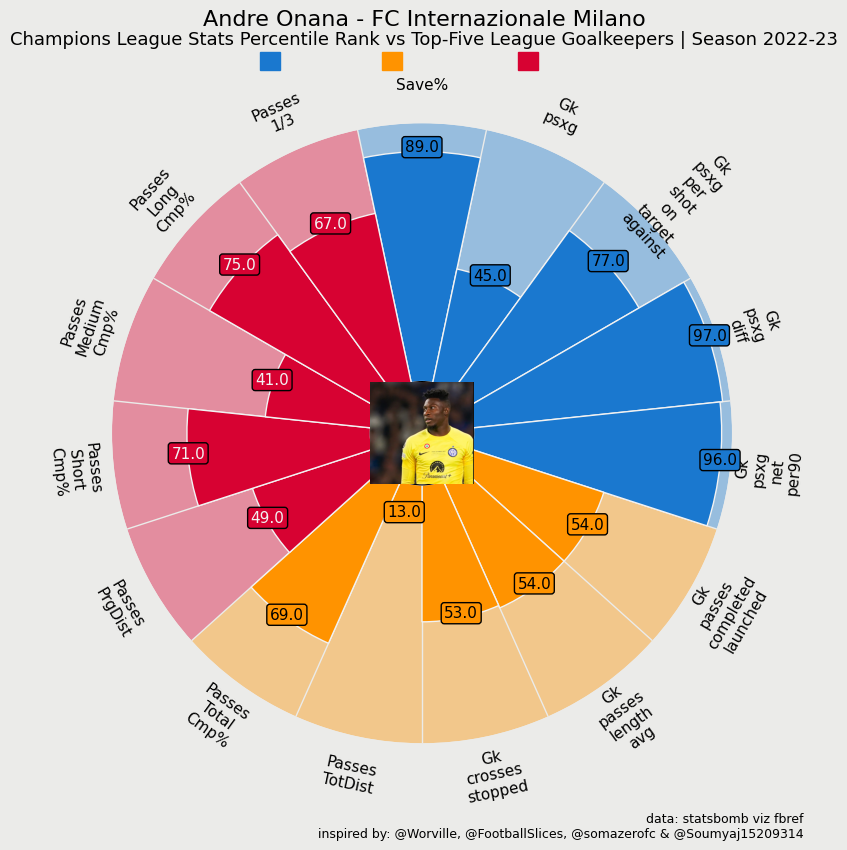

In [39]:
import matplotlib.pyplot as plt
from mplsoccer import PyPizza

slice_colors = ["#1A78CF"] * 5 + ["#FF9300"] * 5 + ["#D70232"] * 5
text_colors = ["#000000"] * 10 + ["#F2F2F2"] * 5

baker = PyPizza(
params=split_params, # list of parameters
background_color="#EBEBE9", # background color
straight_line_color="#EBEBE9", # color for straight lines
straight_line_lw=1, # linewidth for straight lines
last_circle_lw=0, # linewidth of last circle
other_circle_lw=0, # linewidth for other circles
inner_circle_size=20 # size of inner circle
)

fig, ax = baker.make_pizza(
    values,  # list of values
    figsize=(8, 8.5),  # adjust figsize according to your need
    color_blank_space="same",  # use same color to fill blank space
    slice_colors=slice_colors,  # color for individual slices
    value_colors=text_colors,  # color for the value-text
    value_bck_colors=slice_colors,  # color for the blank spaces
    blank_alpha=0.4,  # alpha for blank-space colors
    param_location=115,  # move param labels further out
    kwargs_slices=dict(
        edgecolor="#F2F2F2", zorder=2, linewidth=1
    ),  # values to be used when plotting slices
    kwargs_params=dict(
        color="#000000", fontsize=11,
        va="center"  # ha is removed here
    ),  # values to be used when adding parameters
    kwargs_values=dict(
        color="#000000", fontsize=11,
        zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )  # values to be used when adding parameter-values
)


fig.text(
0.515, 0.975, "Andre Onana - FC Internazionale Milano", size=16,
ha="center", color="#000000"
)


fig.text(
0.515, 0.953,
"Champions League Stats Percentile Rank vs Top-Five League Goalkeepers | Season 2022-23",
size=13,
ha="center", color="#000000"
)


CREDIT_1 = "data: statsbomb viz fbref"
CREDIT_2 = "inspired by: @Worville, @FootballSlices, @somazerofc & @Soumyaj15209314"

fig.text(
0.99, 0.02, f"{CREDIT_1}\n{CREDIT_2}", size=9,
color="#000000",
ha="right"
)


fig.patches.extend([
plt.Rectangle(
(0.31, 0.9225), 0.025, 0.021, fill=True, color="#1a78cf",
transform=fig.transFigure, figure=fig
),
plt.Rectangle(
(0.462, 0.9225), 0.025, 0.021, fill=True, color="#ff9300",
transform=fig.transFigure, figure=fig
),
plt.Rectangle(
(0.632, 0.9225), 0.025, 0.021, fill=True, color="#d70232",
transform=fig.transFigure, figure=fig
),
])


ax_image = add_image(
fdj_cropped, fig, left=0.4478, bottom=0.4315, width=0.13, height=0.127
) # these values might differ when you are plotting

plt.show()


In [40]:
gk_2023.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'Player', 'Nation', 'Pos', 'Squad',
       'Comp', 'Age', 'Born', 'MP', 'Starts', 'Min', '90s', 'Goals_Against',
       'Goals_Against_per90', 'Shots_on_Target_Against', 'Saves', 'Save%', 'W',
       'D', 'L', 'CS', 'CS%', 'PK_attempts', 'PK_Allowed', 'PKs_Saved',
       'PK_missed', 'Save%(Penalty Kicks)', 'Gk_free_kick_goals_against',
       'Gk_corner_kick_goals_against', 'Gk_own_goals_against', 'Gk_psxg',
       'Gk_psxg_per_shot_on_target_against', 'Gk_psxg_diff',
       'Gk_psxg_net_per90', 'Gk_passes_completed_launched',
       'Gk_passes_attempted_launched', 'Gk_passes_pct_launched', 'Gk_passes',
       'Gk_passes_throws', 'Gk_pct_passes_launched', 'Gk_passes_length_avg',
       'Gk_goal_kicks', 'Gk_pct_goal_kicks_launched',
       'Gk_goal_kick_length_avg', 'Gk_crosses_faced', 'Gk_crosses_stopped',
       'Gk_crosses_stopped_pct', 'Gk_def_actions_outside_pen_area',
       'Gk_def_actions_outside_pen_area_per90', 'Gk_avg_distance_def_actions

In [41]:
gk_2023[gk_2023['Player']=='Alisson']

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
3,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.9,193.0,26.9,31.3,397.0,23.0,5.8,89.0,2.41,19.8,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0


In [42]:
# Get player names from gk_2022
player_names_2022 = gk_2022['Player'].tolist()

# Filter out names not present in gk_2023
player_names_2022_filtered = [name for name in player_names_2022 if name in gk_2023['Player'].tolist()]
player_names_2022_filtered

['Alisson',
 'Emil Audero',
 'Édgar Badía',
 'Oliver Baumann',
 'Marco Bizot',
 'Yassine Bounou',
 'Claudio Bravo',
 'Koen Casteels',
 'Andrea Consigli',
 'Benoît Costil',
 'Thibaut Courtois',
 'Stole Dimitrievski',
 'Gianluigi Donnarumma',
 'Ederson',
 'Łukasz Fabiański',
 'Aitor Fernández',
 'Álvaro Fernández',
 'Mark Flekken',
 'Fraser Forster',
 'Gauthier Gallon',
 'David de Gea',
 'Rafał Gikiewicz',
 'Ivo Grbić',
 'Vicente Guaita',
 'Samir Handanović',
 'Sergio Herrera',
 'Lukáš Hrádecký',
 'Gregor Kobel',
 'Alban Lafont',
 'Jeremías Ledesma',
 'Hugo Lloris',
 'Anthony Lopes',
 'Pau López',
 'Mike Maignan',
 'Giorgi Mamardashvili',
 'Emiliano Martínez',
 'Illan Meslier',
 'Vanja Milinković-Savić',
 'Lorenzo Montipò',
 'Florian Müller',
 'Juan Musso',
 'Keylor Navas',
 'Manuel Neuer',
 'Alexander Nübel',
 'Jan Oblak',
 'Jonas Omlin',
 'Fernando Pacheco',
 'Rui Patrício',
 'Jordan Pickford',
 'Nick Pope',
 'Ivan Provedel',
 'Predrag Rajković',
 'Aaron Ramsdale',
 'David Raya',
 'Pep

In [43]:
# Filter gk_2022 based on player_names_2022_filtered
gk_2022_filtered = gk_2022[gk_2022['Player'].isin(player_names_2022_filtered)]
gk_2022_filtered

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
2,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,28,1992,36,36,3240,36.0,24,0.67,99,76,75.8,27,7,2,20,55.6,0,0,0,0,0.0,0.0,3.0,1.0,24.4,0.25,1.4,0.04,114.0,258.0,44.2,1216.0,211.0,16.5,26.3,172.0,33.1,33.40,340.0,22.0,6.5,89.0,2.47,18.7,56,200,1214.0,1388.0,87.5,28439.0,18286.0,275.0,276.0,99.6,686.0,699.0,98.1,249.0,409.0,60.9,1,0.2,0.0,0.8,1.0,16.0,1.0,0.0,1.0
6,6,6,Emil Audero,it ITA,GK,Sampdoria,it Serie A,24,1997,29,29,2560,28.4,48,1.69,130,82,63.8,8,5,16,5,17.2,2,1,1,0,50.0,1.0,4.0,1.0,43.1,0.32,-3.9,-0.14,203.0,472.0,43.0,786.0,120.0,41.7,36.3,212.0,67.9,47.60,418.0,22.0,5.3,25.0,0.88,13.5,143,327,706.0,1005.0,70.2,22466.0,16952.0,105.0,105.0,100.0,288.0,297.0,97.0,311.0,593.0,52.4,0,0.5,0.1,-0.5,2.0,20.0,1.0,0.0,0.0
8,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,29,1992,24,24,2160,24.0,35,1.46,114,78,75.4,8,5,11,5,20.8,9,7,1,1,12.5,0.0,5.0,0.0,37.3,0.26,2.3,0.10,182.0,408.0,44.6,618.0,106.0,41.9,36.1,210.0,71.0,49.20,399.0,17.0,4.3,41.0,1.71,16.2,149,258,565.0,830.0,68.1,18595.0,14474.0,77.0,78.0,98.7,229.0,233.0,98.3,257.0,514.0,50.0,0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0
12,12,12,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,31,1990,33,33,2970,33.0,57,1.73,155,98,64.5,12,7,14,8,24.2,4,2,1,1,33.3,0.0,9.0,1.0,51.5,0.33,-4.5,-0.14,138.0,393.0,35.1,1302.0,185.0,26.1,29.0,216.0,24.5,28.80,420.0,27.0,6.4,65.0,1.97,16.7,52,339,1225.0,1523.0,80.4,28367.0,18814.0,366.0,367.0,99.7,589.0,595.0,99.0,258.0,541.0,47.7,0,0.0,0.1,0.0,0.0,18.0,0.0,0.0,0.0
19,19,21,Marco Bizot,nl NED,GK,Brest,fr Ligue 1,30,1991,38,38,3420,38.0,57,1.50,170,115,68.8,13,9,16,7,18.4,4,4,0,0,0.0,0.0,8.0,2.0,51.0,0.28,-4.0,-0.10,290.0,624.0,46.5,877.0,205.0,43.1,37.4,328.0,75.0,53.10,541.0,16.0,3.0,34.0,0.89,14.1,246,377,851.0,1207.0,70.5,29158.0,23011.0,86.0,86.0,100.0,371.0,376.0,98.7,393.0,742.0,53.0,1,0.1,0.1,0.9,2.0,22.0,0.0,0.0,0.0
20,20,22,Yassine Bounou,ma MAR,GK,Sevilla,es La Liga,30,1991,31,31,2790,31.0,24,0.77,100,75,78.0,14,13,4,13,41.9,4,2,1,1,33.3,2.0,6.0,0.0,26.6,0.24,2.6,0.09,152.0,378.0,40.2,829.0,116.0,30.2,33.1,241.0,53.1,41.20,420.0,27.0,6.4,24.0,0.77,12.8,127,250,819.0,1072.0,76.4,23163.0,13690.0,114.0,114.0,100.0,437.0,444.0,98.4,267.0,510.0,52.4,2,0.6,0.0,1.4,2.0,10.0,0.0,0.0,0.0
21,21,23,Claudio Bravo,cl CHI,GK,Betis,es La Liga,38,1983,17,17,1456,16.2,19,1.17,56,39,67.9,8,4,5,5,29.4,1,1,0,0,0.0,0.0,1.0,2.0,18.6,0.31,1.6,0.10,109.0,272.0,40.1,405.0,53.0,51.9,39.9,99.0,62.6,47.90,251.0,6.0,2.4,9.0,0.56,11.0,61,210,332.0,507.0,65.5,10758.0,8164.0,55.0,55.0,100.0,128.0,132.0,97.0,147.0,315.0,46.7,0,0.1,0.0,-0.1,1.0,9.0,1.0,0.0,0.0
31,31,33,Koen Casteels,be BEL,GK,Wolfsburg,de Bundesliga,29,1992,28,28,2520,28.0,40,1.43,118,76,68.6,11,6,11,10,35.7,6,3,2,1,40.0,0.0,4.0,0.0,42.0,0.32,2.0,0.07,165.0,370.0,44.6,873.0,135.0,30.6,32.3,204.0,50.5,42.10,413.0,31.0,7.5,30.0,1.07,14.8,103,267,843.0,1079.0,78.1,24035.0,16216.0,144.0,1

In [44]:
# Get player names from gk_2021
player_names_2021 = gk_2021['Player'].tolist()

# Filter out names not present in gk_2023
player_names_2021_filtered = [name for name in player_names_2021 if name in gk_2023['Player'].tolist()]
player_names_2021_filtered

['Alisson',
 'Sergio Asenjo',
 'Emil Audero',
 'Édgar Badía',
 'Oliver Baumann',
 'Paul Bernardoni',
 'Yassine Bounou',
 'Claudio Bravo',
 'Koen Casteels',
 'Andrea Consigli',
 'Benoît Costil',
 'Thibaut Courtois',
 'Marko Dmitrović',
 'Gianluigi Donnarumma',
 'Bartłomiej Drągowski',
 'Ederson',
 'Łukasz Fabiański',
 'Ralf Fährmann',
 'Aitor Fernández',
 'Álvaro Fernández',
 'David de Gea',
 'Rafał Gikiewicz',
 'Vicente Guaita',
 'Samir Handanović',
 'Dean Henderson',
 'Sergio Herrera',
 'Lukáš Hrádecký',
 'Gregor Kobel',
 'Alban Lafont',
 'Benjamin Lecomte',
 'Jeremías Ledesma',
 'Bernd Leno',
 'Hugo Lloris',
 'Anthony Lopes',
 'Pau López',
 'Mike Maignan',
 'Steve Mandanda',
 'Emiliano Martínez',
 'Jordi Masip',
 'Alex Meret',
 'Illan Meslier',
 'Lorenzo Montipò',
 'Florian Müller',
 'Juan Musso',
 'Keylor Navas',
 'Manuel Neuer',
 'Jan Oblak',
 'Jonas Omlin',
 'Fernando Pacheco',
 'Rui Patrício',
 'Jiří Pavlenka',
 'Mattia Perin',
 'Jordan Pickford',
 'Nick Pope',
 'Ivan Provedel',


In [45]:
# Filter gk_2022 based on player_names_2022_filtered
gk_2021_filtered = gk_2021[gk_2021['Player'].isin(player_names_2021_filtered)]
gk_2021_filtered

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
2,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,27,1992,33,33,2970,33.0,32.0,0.97,115,82,75.7,18.0,8.0,7,10.0,30.3,8.0,4.0,1.0,3.0,20.0,1.0,4.0,0.0,35.0,0.27,3.0,0.09,74,194,38.1,980,165,14.9,25.7,173,27.7,30.4,341,20,5.9,87.0,2.64,18.6,47,146,1000.0,1157.0,86.4,22600.0,14023.0,223.0,225.0,99.1,578.0,590.0,98.0,191.0,330.0,57.9,0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,1.0
8,8,8,Sergio Asenjo,es ESP,GK,Villarreal,es La Liga,31,1989,36,36,3240,36.0,40.0,1.11,118,79,72.0,15.0,13.0,8,10.0,27.8,9.0,7.0,1.0,1.0,12.5,0.0,3.0,2.0,36.0,0.24,-2.0,-0.06,157,406,38.7,1022,190,26.3,30.2,283,48.4,40.4,564,27,4.8,32.0,0.89,13.9,136,268,1022.0,1308.0,78.1,26484.0,17800.0,229.0,229.0,100.0,509.0,520.0,97.9,276.0,548.0,50.4,0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0
9,9,9,Emil Audero,it ITA,GK,Sampdoria,it Serie A,23,1997,37,37,3330,37.0,54.0,1.46,173,118,72.8,14.0,7.0,16,6.0,16.2,9.0,7.0,2.0,0.0,22.2,1.0,6.0,1.0,51.9,0.25,-1.1,-0.03,213,543,39.2,986,180,38.2,35.0,259,64.1,45.3,563,12,2.1,34.0,0.92,14.8,166,376,877.0,1247.0,70.3,26471.0,19006.0,124.0,125.0,99.2,387.0,394.0,98.2,364.0,724.0,50.3,1,0.2,0.0,0.8,1.0,12.0,0.0,0.0,0.0
10,10,10,Édgar Badía,es ESP,GK,Elche,es La Liga,28,1992,30,30,2700,30.0,46.0,1.53,141,92,70.9,5.0,11.0,14,5.0,16.7,9.0,5.0,3.0,1.0,37.5,0.0,3.0,0.0,52.5,0.33,6.5,0.22,208,453,45.9,864,144,33.0,32.7,285,58.9,41.4,444,8,1.8,31.0,1.03,13.9,167,285,865.0,1150.0,75.2,24979.0,18958.0,154.0,155.0,99.4,385.0,396.0,97.2,306.0,578.0,52.9,0,0.0,0.0,0.0,0.0,13.0,0.0,0.0,1.0
12,12,12,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,30,1990,31,31,2790,31.0,51.0,1.65,132,81,65.9,10.0,8.0,13,6.0,19.4,9.0,6.0,2.0,1.0,25.0,0.0,4.0,2.0,49.4,0.32,0.4,0.01,134,407,32.9,1143,176,29.2,29.9,204,35.8,32.0,417,14,3.4,53.0,1.71,18.3,73,333,1049.0,1349.0,77.8,24414.0,16656.0,298.0,298.0,100.0,486.0,495.0,98.2,246.0,535.0,46.0,0,0.0,0.1,0.0,0.0,15.0,0.0,0.0,2.0
15,15,15,Paul Bernardoni,fr FRA,GK,Angers,fr Ligue 1,23,1997,38,38,3420,38.0,58.0,1.53,139,82,63.3,12.0,8.0,18,9.0,23.7,8.0,7.0,1.0,0.0,12.5,0.0,5.0,1.0,53.5,0.33,-3.5,-0.09,143,456,31.4,712,214,37.5,35.2,269,70.3,50.9,516,19,3.7,17.0,0.45,11.3,189,267,640.0,985.0,65.0,19137.0,14456.0,89.0,89.0,100.0,303.0,309.0,98.1,246.0,580.0,42.4,0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0
19,19,19,Yassine Bounou,ma MAR,GK,Sevilla,es La Liga,29,1991,33,33,2970,33.0,28.0,0.85,106,78,77.4,21.0,5.0,7,15.0,45.5,6.0,4.0,2.0,0.0,33.3,0.0,4.0,2.0,27.8,0.21,1.8,0.05,166,381,43.6,895,147,30.5,32.0,200,54.0,40.7,450,26,5.8,34.0,1.03,15.0,108,272,862.0,1096.0,78.6,24127.0,14214.0,122.0,123.0,99.2,451.0,455.0,99.1,288.0,514.0,56.0,0,0.0,0.0,0.0,1.0,6.0,0.0,0.0,0.0
20,20,20,Claudio Bravo,cl CHI,GK,Betis,es La Liga,37,1983,20,20,1800,20.0,25.0,1.25,75,50,72.0,8.0,8.0,4,7.0,35.0,5.0,4.0,1.0,0.0,20.0,0.0,0.0,1.0,24.0,0.26,0.0,0.00,117,328,35.7,518,82,47.3,38.1,129,64.3,48.5,287,11,3.8,16.0,0.80,13.0,82,245,422.0,648.0,65.1,12642

In [46]:
len(gk_2021_filtered)

76

In [47]:
len(gk_2022_filtered)

78

In [48]:
full_Gk = pd.concat([gk_2023, gk_2022_filtered, gk_2021_filtered], ignore_index=True)
full_Gk

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
0,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19.0,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0
1,5,5,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,29,29,2565,28.5,33.0,1.16,120.0,90.0,73.3,8.0,9.0,12.0,9.0,31.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,35.0,0.29,5.0,0.18,68.0,213.0,31.9,864.0,151.0,17.1,26.30,182.0,35.7,31.50,332.0,15.0,4.5,52.0,1.82,16.90,64,147,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0
2,6,6,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10,10,900,10.0,21.0,2.10,51.0,30.0,60.8,2.0,2.0,6.0,1.0,10.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,16.8,0.31,-4.2,-0.42,58.0,162.0,35.8,260.0,46.0,38.8,35.80,92.0,66.3,51.20,166.0,5.0,3.0,17.0,1.70,16.10,60,100,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
3,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2.0,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0,0.92,13.90,114,327,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0
4,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36,36,3240,36.0,63.0,1.75,200.0,136.0,72.0,5.0,10.0,21.0,4.0,11.1,10.0,7.0,3.0,0.0,30.0,0.0,4.0,2.0,69.5,0.31,8.5,0.24,191.0,422.0,45.3,772.0,166.0,33.8,34.20,296.0,54.4,41.70,574.0,21.0,3.7,20.0,0.56,12.70,161,260,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0
5,10,10,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,32,1990,34,34,3060,34.0,57.0,1.68,161.0,105.0,65.8,10.0,6.0,18.0,5.0,14.7,3.0,2.0,0.0,1.0,0.0,1.0,11.0,1.0,50.4,0.31,-5.6,-0.16,206.0,525.0,39.2,1164.0,168.0,35.3,33.60,249.0,45.8,39.30,529.0,43.0,8.1,43.0,1.26,13.40,114,410,1068.0,1417.0,75.4,29033.0,20956.0,239.0,239.0,100.0,489.0,493.0,99.2,331.0,670.0,49.4,0,0.0,0.1,0.0,1.0,28.0,1.0,0.0,1.0
6,11,11,Gavin Bazunu,ie IRL,GK,Southampton,eng Premier League,20,2002,32,32,2880,32.0,56.0,1.75,120.0,67.0,54.2,6.0,6.0,20.0,4.0,12.5,2.0,1.0,1.0,0.0,50.0,1.0,7.0,4.0,35.4,0.28,-16.6,-0.52,212.0,629.0,33.7,935.0,144.0,50.2,38.10,237.0,67.5,50.00,456.0,36.0,7.9,48.0,1.50,15.10,159,469,718.0,1178.0,61.0,21528.0,16289.0,183.0,185.0,98.9,256.0,263.0,97.3,278.0,722.0,38.5,0,0.1,0.1,-0.1,1.0,42.0,1.0,0.0,1.0
7,14,14,Paul Bernardoni,fr FRA,GK,Angers,fr Ligue 1,25,1997,27,27,2430,27.0,62.0,2.30,143.0,84.0,62.2,1

In [49]:
duplicate_players = full_Gk[full_Gk.duplicated(subset=['Player','Pos'], keep=False)]['Player'].unique()
duplicate_players

array(['Alisson', 'Sergio Asenjo', 'Emil Audero', 'Édgar Badía',
       'Oliver Baumann', 'Paul Bernardoni', 'Marco Bizot',
       'Yassine Bounou', 'Claudio Bravo', 'Koen Casteels',
       'Andrea Consigli', 'Benoît Costil', 'Thibaut Courtois',
       'Stole Dimitrievski', 'Marko Dmitrović', 'Gianluigi Donnarumma',
       'Bartłomiej Drągowski', 'Ederson', 'Łukasz Fabiański',
       'Ralf Fährmann', 'Aitor Fernández', 'Álvaro Fernández',
       'Mark Flekken', 'Fraser Forster', 'Gauthier Gallon',
       'David de Gea', 'Rafał Gikiewicz', 'Ivo Grbić', 'Vicente Guaita',
       'Samir Handanović', 'Dean Henderson', 'Sergio Herrera',
       'Lukáš Hrádecký', 'Gregor Kobel', 'Alban Lafont',
       'Jeremías Ledesma', 'Bernd Leno', 'Hugo Lloris', 'Anthony Lopes',
       'Pau López', 'Mike Maignan', 'Giorgi Mamardashvili',
       'Steve Mandanda', 'Emiliano Martínez', 'Jordi Masip', 'Alex Meret',
       'Illan Meslier', 'Vanja Milinković-Savić', 'Lorenzo Montipò',
       'Florian Müller', 'J

In [50]:
len(duplicate_players)

93

In [51]:
duplicate_players_stats = full_Gk[full_Gk['Player'].isin(duplicate_players)]
duplicate_players_stats


,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
0,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19.0,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0
2,6,6,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10,10,900,10.0,21.0,2.10,51.0,30.0,60.8,2.0,2.0,6.0,1.0,10.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,16.8,0.31,-4.2,-0.42,58.0,162.0,35.8,260.0,46.0,38.8,35.80,92.0,66.3,51.20,166.0,5.0,3.0,17.0,1.70,16.10,60,100,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
3,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2.0,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0,0.92,13.90,114,327,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0
4,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36,36,3240,36.0,63.0,1.75,200.0,136.0,72.0,5.0,10.0,21.0,4.0,11.1,10.0,7.0,3.0,0.0,30.0,0.0,4.0,2.0,69.5,0.31,8.5,0.24,191.0,422.0,45.3,772.0,166.0,33.8,34.20,296.0,54.4,41.70,574.0,21.0,3.7,20.0,0.56,12.70,161,260,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0
5,10,10,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,32,1990,34,34,3060,34.0,57.0,1.68,161.0,105.0,65.8,10.0,6.0,18.0,5.0,14.7,3.0,2.0,0.0,1.0,0.0,1.0,11.0,1.0,50.4,0.31,-5.6,-0.16,206.0,525.0,39.2,1164.0,168.0,35.3,33.60,249.0,45.8,39.30,529.0,43.0,8.1,43.0,1.26,13.40,114,410,1068.0,1417.0,75.4,29033.0,20956.0,239.0,239.0,100.0,489.0,493.0,99.2,331.0,670.0,49.4,0,0.0,0.1,0.0,1.0,28.0,1.0,0.0,1.0
7,14,14,Paul Bernardoni,fr FRA,GK,Angers,fr Ligue 1,25,1997,27,27,2430,27.0,62.0,2.30,143.0,84.0,62.2,1.0,5.0,21.0,3.0,11.1,9.0,8.0,0.0,1.0,0.0,1.0,6.0,3.0,51.4,0.31,-7.6,-0.28,94.0,291.0,32.3,479.0,124.0,39.5,34.60,185.0,55.1,42.60,357.0,21.0,5.9,18.0,0.67,11.40,101,189,438.0,667.0,65.7,12371.0,9125.0,77.0,79.0,97.5,218.0,224.0,97.3,141.0,359.0,39.3,0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,0.0
8,15,15,Marco Bizot,nl NED,GK,Brest,fr Ligue 1,31,1991,37,37,3330,37.0,54.0,1.46,176.0,122.0,73.3,11.0,10.0,16.0,8.0,21.6,9.0,7.0,2.0,0.0,22.2,1.0,11.0,2.0,54.9,0.26,2.9,0.08,198.0,477.0,41.5,806.0,163.0,38.2,35.50,289.0,58.5,43.90,520.0,30.0,5.8,25.0,0.68,11.60,169,307,799.0,1096.0,72.9,24651.0,17824.0,87.0,87.0,100.0,405.0,411.0,98.5,305.0,595.0,51.3,0,0.0,0.1,0.0,0.0,14.0,1.0,0.0,0.0
10,19,19,Yassine Bounou,ma MAR,GK,Sevilla,es La Liga,31,1991,25,25,2151,23.9,41.0,1.72,106.0,66.0,63.2,7.0,6.0,12.0,4.0,16.0,3.0

In [52]:
len(duplicate_players_stats)

247

In [53]:
# Convert the filtered player lists into sets
players_set_2021 = set(player_names_2021_filtered)
players_set_2022 = set(player_names_2022_filtered)

# Find the common players present in 2021, 2022, and 2023
common_players = players_set_2021.intersection(players_set_2022)

# Convert the common players back to a list
common_players_list = list(common_players)
common_players_list

['Gianluigi Donnarumma',
 'Andrea Consigli',
 'Łukasz Fabiański',
 'Ederson',
 'Florian Müller',
 'Wojciech Szczęsny',
 'Álvaro Fernández',
 'Aitor Fernández',
 'Édgar Badía',
 'Mike Maignan',
 'Alexander Schwolow',
 'Vicente Guaita',
 'Łukasz Skorupski',
 'David de Gea',
 'Manuel Neuer',
 'Aaron Ramsdale',
 'Robin Zentner',
 'Anthony Lopes',
 'Koen Casteels',
 'Jonas Omlin',
 'Lorenzo Montipò',
 'Jeremías Ledesma',
 'Benoît Costil',
 'Thibaut Courtois',
 'Illan Meslier',
 'Alban Lafont',
 'Fernando Pacheco',
 'Predrag Rajković',
 'Marco Silvestri',
 'Rui Patrício',
 'Pau López',
 'Oliver Baumann',
 'Álex Remiro',
 'Ivan Provedel',
 'Nick Pope',
 'Jordan Pickford',
 'Pepe Reina',
 'Robert Sánchez',
 'Marc-André ter Stegen',
 'Rafał Gikiewicz',
 'Alisson',
 'Samir Handanović',
 'Kevin Trapp',
 'David Soria',
 'Kasper Schmeichel',
 'Emil Audero',
 'Keylor Navas',
 'Hugo Lloris',
 'Sergio Herrera',
 'Unai Simón',
 'Emiliano Martínez',
 'Yassine Bounou',
 'Rui Silva',
 'Gregor Kobel',
 'Ja

In [54]:
len(common_players_list)

61

In [55]:
full_Gk[full_Gk['Player']=='Alisson']

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
0,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19.0,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.9,193.0,26.9,31.3,397.0,23.0,5.8,89.0,2.41,19.8,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0
124,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,28,1992,36,36,3240,36.0,24.0,0.67,99.0,76.0,75.8,27.0,7.0,2.0,20.0,55.6,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,24.4,0.25,1.4,0.04,114.0,258.0,44.2,1216.0,211.0,16.5,26.3,172.0,33.1,33.4,340.0,22.0,6.5,89.0,2.47,18.7,56,200,1214.0,1388.0,87.5,28439.0,18286.0,275.0,276.0,99.6,686.0,699.0,98.1,249.0,409.0,60.9,1,0.2,0.0,0.8,1.0,16.0,1.0,0.0,1.0
202,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,27,1992,33,33,2970,33.0,32.0,0.97,115.0,82.0,75.7,18.0,8.0,7.0,10.0,30.3,8.0,4.0,1.0,3.0,20.0,1.0,4.0,0.0,35.0,0.27,3.0,0.09,74.0,194.0,38.1,980.0,165.0,14.9,25.7,173.0,27.7,30.4,341.0,20.0,5.9,87.0,2.64,18.6,47,146,1000.0,1157.0,86.4,22600.0,14023.0,223.0,225.0,99.1,578.0,590.0,98.0,191.0,330.0,57.9,0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,1.0


In [56]:
full_Gk[full_Gk['Player']=='Alex Cordaz']

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes


In [57]:
full_Gk

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes
0,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19.0,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0
1,5,5,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,29,29,2565,28.5,33.0,1.16,120.0,90.0,73.3,8.0,9.0,12.0,9.0,31.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,35.0,0.29,5.0,0.18,68.0,213.0,31.9,864.0,151.0,17.1,26.30,182.0,35.7,31.50,332.0,15.0,4.5,52.0,1.82,16.90,64,147,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0
2,6,6,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10,10,900,10.0,21.0,2.10,51.0,30.0,60.8,2.0,2.0,6.0,1.0,10.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,16.8,0.31,-4.2,-0.42,58.0,162.0,35.8,260.0,46.0,38.8,35.80,92.0,66.3,51.20,166.0,5.0,3.0,17.0,1.70,16.10,60,100,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
3,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2.0,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0,0.92,13.90,114,327,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0
4,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36,36,3240,36.0,63.0,1.75,200.0,136.0,72.0,5.0,10.0,21.0,4.0,11.1,10.0,7.0,3.0,0.0,30.0,0.0,4.0,2.0,69.5,0.31,8.5,0.24,191.0,422.0,45.3,772.0,166.0,33.8,34.20,296.0,54.4,41.70,574.0,21.0,3.7,20.0,0.56,12.70,161,260,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0
5,10,10,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,32,1990,34,34,3060,34.0,57.0,1.68,161.0,105.0,65.8,10.0,6.0,18.0,5.0,14.7,3.0,2.0,0.0,1.0,0.0,1.0,11.0,1.0,50.4,0.31,-5.6,-0.16,206.0,525.0,39.2,1164.0,168.0,35.3,33.60,249.0,45.8,39.30,529.0,43.0,8.1,43.0,1.26,13.40,114,410,1068.0,1417.0,75.4,29033.0,20956.0,239.0,239.0,100.0,489.0,493.0,99.2,331.0,670.0,49.4,0,0.0,0.1,0.0,1.0,28.0,1.0,0.0,1.0
6,11,11,Gavin Bazunu,ie IRL,GK,Southampton,eng Premier League,20,2002,32,32,2880,32.0,56.0,1.75,120.0,67.0,54.2,6.0,6.0,20.0,4.0,12.5,2.0,1.0,1.0,0.0,50.0,1.0,7.0,4.0,35.4,0.28,-16.6,-0.52,212.0,629.0,33.7,935.0,144.0,50.2,38.10,237.0,67.5,50.00,456.0,36.0,7.9,48.0,1.50,15.10,159,469,718.0,1178.0,61.0,21528.0,16289.0,183.0,185.0,98.9,256.0,263.0,97.3,278.0,722.0,38.5,0,0.1,0.1,-0.1,1.0,42.0,1.0,0.0,1.0
7,14,14,Paul Bernardoni,fr FRA,GK,Angers,fr Ligue 1,25,1997,27,27,2430,27.0,62.0,2.30,143.0,84.0,62.2,1

In [58]:
unique_comps = full_Gk['Comp'].unique()
print(unique_comps)


['eng Premier League' 'es La Liga' 'it Serie A' 'de Bundesliga'
 'fr Ligue 1' 'es La Liga+fr Ligue 1' 'fr Ligue 1+de Bundesliga'
 'it Serie A+fr Ligue 1']


In [59]:
# Defining a function to check if a league is in the 'Comp' column
def check_league_in_comp(row, league):
    if league in row['Comp']:
        return 1
    else:
        return 0

# Adding the new columns
full_Gk['Seasons at top 5'] = 1
full_Gk['Seasons in PL'] = full_Gk.apply(lambda row: check_league_in_comp(row, 'eng Premier League'), axis=1)
full_Gk['Seasons in Liga'] = full_Gk.apply(lambda row: check_league_in_comp(row, 'es La Liga'), axis=1)
full_Gk['Seasons in Serie A'] = full_Gk.apply(lambda row: check_league_in_comp(row, 'it Serie A'), axis=1)
full_Gk['Seasons in Ligue 1'] = full_Gk.apply(lambda row: check_league_in_comp(row, 'fr Ligue 1'), axis=1)
full_Gk['Seasons in Bundesliga'] = full_Gk.apply(lambda row: check_league_in_comp(row, 'de Bundesliga'), axis=1)


In [60]:
full_Gk

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19.0,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0,1,1,0,0,0,0
1,5,5,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,29,29,2565,28.5,33.0,1.16,120.0,90.0,73.3,8.0,9.0,12.0,9.0,31.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,35.0,0.29,5.0,0.18,68.0,213.0,31.9,864.0,151.0,17.1,26.30,182.0,35.7,31.50,332.0,15.0,4.5,52.0,1.82,16.90,64,147,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,1,1,0,0,0,0
2,6,6,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10,10,900,10.0,21.0,2.10,51.0,30.0,60.8,2.0,2.0,6.0,1.0,10.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,16.8,0.31,-4.2,-0.42,58.0,162.0,35.8,260.0,46.0,38.8,35.80,92.0,66.3,51.20,166.0,5.0,3.0,17.0,1.70,16.10,60,100,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,1,0,1,0,0,0
3,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2.0,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0,0.92,13.90,114,327,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0,1,0,0,1,0,0
4,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36,36,3240,36.0,63.0,1.75,200.0,136.0,72.0,5.0,10.0,21.0,4.0,11.1,10.0,7.0,3.0,0.0,30.0,0.0,4.0,2.0,69.5,0.31,8.5,0.24,191.0,422.0,45.3,772.0,166.0,33.8,34.20,296.0,54.4,41.70,574.0,21.0,3.7,20.0,0.56,12.70,161,260,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,1,0,1,0,0,0
5,10,10,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,32,1990,34,34,3060,34.0,57.0,1.68,161.0,105.0,65.8,10.0,6.0,18.0,5.0,14.7,3.0,2.0,0.0,1.0,0.0,1.0,11.0,1.0,50.4,0.31,-5.6,-0.16,206.0,525.0,39.2,1164.0,168.0,35.3,33.60,249.0,45.8,39.30,529.0,43.0,8.1,43.0,1.26,13.40,114,410,1068.0,1417.0,75.4,29033.0,20956.0,239.0,239.0,100.0,489.0,493.0,99.2,331.0,670.0,49.4,0,0.0,0.1,0.0,1.0,28.0,1.0,0.0,1.0,1,0,0,0,0,1
6,11,11,Gavin Bazunu,ie IRL,GK,Southampton,eng Premier League,20,2002,32,32,2880,32.0,56.0,1.75,120.0,67.0,54.2,6.0,6.0,20.0,4.0,12.5,2.0,1.0,1.0,0.0,50.0,1.0,7.0,4.0,35.4,0.28,-16.6,-0.52,212.0,629.0,33.7,935.0,144.0,50.2,38.10,237.0,67.5,50.00,456.0,36.0,7.9,48.0,1.50,15.10,159,469,718.0,1178.0,61.0,21528.0,16289.0,183.0,185.0

In [61]:
full_Gk[full_Gk['Player']=='Edouard Mendy']

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga


In [62]:
full_Gk.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'Player', 'Nation', 'Pos', 'Squad',
       'Comp', 'Age', 'Born', 'MP', 'Starts', 'Min', '90s', 'Goals_Against',
       'Goals_Against_per90', 'Shots_on_Target_Against', 'Saves', 'Save%', 'W',
       'D', 'L', 'CS', 'CS%', 'PK_attempts', 'PK_Allowed', 'PKs_Saved',
       'PK_missed', 'Save%(Penalty Kicks)', 'Gk_free_kick_goals_against',
       'Gk_corner_kick_goals_against', 'Gk_own_goals_against', 'Gk_psxg',
       'Gk_psxg_per_shot_on_target_against', 'Gk_psxg_diff',
       'Gk_psxg_net_per90', 'Gk_passes_completed_launched',
       'Gk_passes_attempted_launched', 'Gk_passes_pct_launched', 'Gk_passes',
       'Gk_passes_throws', 'Gk_pct_passes_launched', 'Gk_passes_length_avg',
       'Gk_goal_kicks', 'Gk_pct_goal_kicks_launched',
       'Gk_goal_kick_length_avg', 'Gk_crosses_faced', 'Gk_crosses_stopped',
       'Gk_crosses_stopped_pct', 'Gk_def_actions_outside_pen_area',
       'Gk_def_actions_outside_pen_area_per90', 'Gk_avg_distance_def_actions

In [63]:
filtered_Gk = full_Gk[full_Gk['Player'].isin(common_players_list)]
filtered_Gk

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19.0,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0,1,1,0,0,0,0
3,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2.0,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0,0.92,13.90,114,327,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0,1,0,0,1,0,0
4,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36,36,3240,36.0,63.0,1.75,200.0,136.0,72.0,5.0,10.0,21.0,4.0,11.1,10.0,7.0,3.0,0.0,30.0,0.0,4.0,2.0,69.5,0.31,8.5,0.24,191.0,422.0,45.3,772.0,166.0,33.8,34.20,296.0,54.4,41.70,574.0,21.0,3.7,20.0,0.56,12.70,161,260,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,1,0,1,0,0,0
5,10,10,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,32,1990,34,34,3060,34.0,57.0,1.68,161.0,105.0,65.8,10.0,6.0,18.0,5.0,14.7,3.0,2.0,0.0,1.0,0.0,1.0,11.0,1.0,50.4,0.31,-5.6,-0.16,206.0,525.0,39.2,1164.0,168.0,35.3,33.60,249.0,45.8,39.30,529.0,43.0,8.1,43.0,1.26,13.40,114,410,1068.0,1417.0,75.4,29033.0,20956.0,239.0,239.0,100.0,489.0,493.0,99.2,331.0,670.0,49.4,0,0.0,0.1,0.0,1.0,28.0,1.0,0.0,1.0,1,0,0,0,0,1
7,14,14,Paul Bernardoni,fr FRA,GK,Angers,fr Ligue 1,25,1997,27,27,2430,27.0,62.0,2.30,143.0,84.0,62.2,1.0,5.0,21.0,3.0,11.1,9.0,8.0,0.0,1.0,0.0,1.0,6.0,3.0,51.4,0.31,-7.6,-0.28,94.0,291.0,32.3,479.0,124.0,39.5,34.60,185.0,55.1,42.60,357.0,21.0,5.9,18.0,0.67,11.40,101,189,438.0,667.0,65.7,12371.0,9125.0,77.0,79.0,97.5,218.0,224.0,97.3,141.0,359.0,39.3,0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,0.0,1,0,0,0,1,0
10,19,19,Yassine Bounou,ma MAR,GK,Sevilla,es La Liga,31,1991,25,25,2151,23.9,41.0,1.72,106.0,66.0,63.2,7.0,6.0,12.0,4.0,16.0,3.0,2.0,1.0,0.0,33.3,1.0,3.0,2.0,37.3,0.34,-1.7,-0.07,115.0,303.0,38.0,785.0,92.0,27.9,30.90,162.0,51.9,42.10,308.0,20.0,6.5,39.0,1.63,17.40,84,219,717.0,949.0,75.6,18725.0,13212.0,155.0,155.0,100.0,341.0,349.0,97.7,219.0,440.0,49.8,0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,1.0,1,0,1,0,0,0
11,20,20,Claudio Bravo,cl CHI,GK,Betis,es La Liga,39,1983,12,12,1080,12.0,9.0,0.75,42.0,33.0,81.0,5.0,5.0,2.0,4.0,33.3,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,11.0,0.24,2.0,0.17,75.0,225.0,33.3,288.0,42.0,51.7,39.60,101.0,75.2,52.50,213.0,4.0,1.9,6.0,0.50,12.10,75,148,232.0,392.0,59.2,7419.0,5674.0,44.0,44.0,100.0,89.0,91.0,97.8,96.

In [64]:
filtered_Gk[filtered_Gk['Player']=='Alisson']

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19.0,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.9,193.0,26.9,31.3,397.0,23.0,5.8,89.0,2.41,19.8,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0,1,1,0,0,0,0
124,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,28,1992,36,36,3240,36.0,24.0,0.67,99.0,76.0,75.8,27.0,7.0,2.0,20.0,55.6,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,24.4,0.25,1.4,0.04,114.0,258.0,44.2,1216.0,211.0,16.5,26.3,172.0,33.1,33.4,340.0,22.0,6.5,89.0,2.47,18.7,56,200,1214.0,1388.0,87.5,28439.0,18286.0,275.0,276.0,99.6,686.0,699.0,98.1,249.0,409.0,60.9,1,0.2,0.0,0.8,1.0,16.0,1.0,0.0,1.0,1,1,0,0,0,0
202,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,27,1992,33,33,2970,33.0,32.0,0.97,115.0,82.0,75.7,18.0,8.0,7.0,10.0,30.3,8.0,4.0,1.0,3.0,20.0,1.0,4.0,0.0,35.0,0.27,3.0,0.09,74.0,194.0,38.1,980.0,165.0,14.9,25.7,173.0,27.7,30.4,341.0,20.0,5.9,87.0,2.64,18.6,47,146,1000.0,1157.0,86.4,22600.0,14023.0,223.0,225.0,99.1,578.0,590.0,98.0,191.0,330.0,57.9,0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,1.0,1,1,0,0,0,0


In [65]:
def calculate_percentage(feature1,allfeature1,feature2,allfeature2,feature3,allfeature3):
    return round((feature1+feature2+feature3)/(allfeature1+allfeature2+allfeature3),2)*100

In [66]:
duplicates = pd.DataFrame(columns=filtered_Gk.columns)

def calculate_combined_stats(minutes1, stats1, minutes2, stats2, minutes3, stats3):
    total_minutes = minutes1 + minutes2 + minutes3
    combined_stats = (stats1 + stats2 + stats3 ) / total_minutes
    return round(combined_stats, 2)

for player_name in common_players_list:
    player_row1 = filtered_Gk[filtered_Gk['Player'] == player_name].iloc[2]
    player_row2 = filtered_Gk[filtered_Gk['Player'] == player_name].iloc[1]
    player_row3 = filtered_Gk[filtered_Gk['Player'] == player_name].iloc[0]
    if player_row1.Comp != player_row2.Comp :
        combined_comp = player_row1.Comp + '+' + player_row2.Comp
    else:
        combined_comp = player_row1.Comp
    if player_row3.Comp in combined_comp :
        combined_comp=combined_comp
    else :
        combined_comp+= '+' + player_row3.Comp
    if player_row1.Squad != player_row2.Squad :
        combined_squad = player_row1.Squad + '+' + player_row2.Squad
    else:
        combined_squad = player_row1.Squad
    if player_row3.Squad in combined_squad :
        combined_squad=combined_squad
    else :
        combined_squad+= '+' + player_row3.Squad
        
  
    combined_row = {
        'Unnamed: 0': len(filtered_Gk),
        'Player': player_name,
        'Nation': player_row1.Nation,
        'Pos': player_row1.Pos,
        'Squad': combined_squad,
        'Comp': combined_comp,
        'Age': player_row3.Age+1,
        'Born': player_row1.Born,
        'MP': player_row1.MP + player_row2.MP + player_row3.MP,
        'Starts': player_row1.Starts + player_row2.Starts + player_row3.Starts,
        'Min': player_row1.Min + player_row2.Min + player_row3.Min,
        '90s': player_row1['90s'] + player_row2['90s']+ player_row3['90s'],
        'Goals_Against': player_row1.Goals_Against + player_row2.Goals_Against + player_row3.Goals_Against,
        'Goals_Against_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1.Goals_Against,
            player_row2['90s'],
            player_row2.Goals_Against,
            player_row3['90s'],
            player_row3.Goals_Against
        ),
        'Shots_on_Target_Against': player_row1.Shots_on_Target_Against + player_row2.Shots_on_Target_Against + player_row3.Shots_on_Target_Against,
        'Saves': player_row1.Saves + player_row2.Saves + player_row3.Saves,
        'Save%': round((player_row1.Saves+ player_row2.Saves + player_row3.Saves)/(player_row1.Shots_on_Target_Against+ player_row2.Shots_on_Target_Against + player_row3.Shots_on_Target_Against),2)*100,
        'W': player_row1.W + player_row2.W + player_row3.W,
        'D': player_row1.D + player_row2.D + player_row3.D,
        'L': player_row1.L + player_row2.L + + player_row3.L,
        'CS': player_row1.CS + player_row2.CS + player_row3.CS,
        'CS%': round((player_row1.CS+ player_row2.CS + player_row3.CS)/(player_row1.MP+ player_row2.MP + + player_row3.MP),2)*100,
        'PK_attempts': player_row1.PK_attempts + player_row2.PK_attempts + player_row3.PK_attempts,
        'PK_Allowed': player_row1.PK_Allowed + player_row2.PK_Allowed + + player_row3.PK_Allowed,
        'PKs_Saved': player_row1.PKs_Saved + player_row2.PKs_Saved + player_row3.PKs_Saved,
        'PK_missed': player_row1.PK_missed + player_row2.PK_missed + + player_row2.PK_missed,
        'Save%(Penalty Kicks)': round((player_row1.PKs_Saved+ player_row2.PKs_Saved +  player_row3.PKs_Saved)/(player_row1.PK_attempts+ player_row2.PK_attempts  + player_row3.PK_attempts),2)*100,
        'Gk_free_kick_goals_against': player_row1.Gk_free_kick_goals_against + player_row2.Gk_free_kick_goals_against + player_row3.Gk_free_kick_goals_against,
        'Gk_corner_kick_goals_against': player_row1.Gk_corner_kick_goals_against + player_row2.Gk_corner_kick_goals_against  + player_row3.Gk_corner_kick_goals_against,
        'Gk_own_goals_against': player_row1.Gk_own_goals_against + player_row2.Gk_own_goals_against + player_row3.Gk_own_goals_against,
        'Gk_psxg': player_row1.Gk_psxg + player_row2.Gk_psxg +  + player_row3.Gk_psxg,
        'Gk_psxg_per_shot_on_target_against': calculate_combined_stats(
            player_row1['Shots_on_Target_Against'],
            player_row1['Gk_psxg'],
            player_row2['Shots_on_Target_Against'],
            player_row2['Gk_psxg'],
            player_row3['Shots_on_Target_Against'],
            player_row3['Gk_psxg']
        ),
        'Gk_psxg_diff': player_row1.Gk_psxg_diff + player_row2.Gk_psxg_diff  + player_row3.Gk_psxg_diff,
        'Gk_psxg_net_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1.Gk_psxg_diff,
            player_row2['90s'],
            player_row2.Gk_psxg_diff,
            player_row3['90s'],
            player_row3.Gk_psxg_diff
        ),
        'Gk_passes_completed_launched': player_row1.Gk_passes_completed_launched + player_row2.Gk_passes_completed_launched + player_row3.Gk_passes_completed_launched ,
        'Gk_passes_attempted_launched': player_row1.Gk_passes_attempted_launched + player_row2.Gk_passes_attempted_launched + player_row3.Gk_passes_attempted_launched,
        'Gk_passes_pct_launched': round((player_row1.Gk_passes_completed_launched+ player_row2.Gk_passes_completed_launched + player_row3.Gk_passes_completed_launched)/(player_row1.Gk_passes_attempted_launched+ player_row2.Gk_passes_attempted_launched + player_row3.Gk_passes_attempted_launched),2)*100,
        'Gk_passes': player_row1.Gk_passes + player_row2.Gk_passes + player_row3.Gk_passes,
        'Gk_passes_throws': player_row1.Gk_passes_throws + player_row2.Gk_passes_throws + player_row3.Gk_passes_throws,
        'Gk_pct_passes_launched': round((player_row1.Gk_passes_launched + player_row2.Gk_passes_launched + player_row3.Gk_passes_launched)/(player_row1.Gk_passes+ player_row2.Gk_passes  + player_row3.Gk_passes),2)*100,
        'Gk_passes_length_avg': round((player_row1.Gk_passes_length_avg + player_row2.Gk_passes_length_avg + player_row3.Gk_passes_length_avg)/3,2),
        'Gk_goal_kicks': player_row1.Gk_goal_kicks + player_row2.Gk_goal_kicks + player_row3.Gk_goal_kicks ,
        'Gk_pct_goal_kicks_launched': round((player_row1.Gk_goal_kicks_launched + player_row2.Gk_goal_kicks_launched + player_row3.Gk_goal_kicks_launched )/(player_row1.Gk_goal_kicks + player_row2.Gk_goal_kicks + player_row3.Gk_goal_kicks),2)*100,
        'Gk_goal_kick_length_avg': round((player_row1.Gk_goal_kick_length_avg + player_row2.Gk_goal_kick_length_avg+ player_row3.Gk_goal_kick_length_avg)/3,2) ,
        'Gk_crosses_faced': player_row1.Gk_crosses_faced + player_row2.Gk_crosses_faced  + player_row3.Gk_crosses_faced,
        'Gk_crosses_stopped': player_row1.Gk_crosses_stopped + player_row2.Gk_crosses_stopped + player_row3.Gk_crosses_stopped,
        'Gk_crosses_stopped_pct': round((player_row1.Gk_crosses_stopped+player_row2.Gk_crosses_stopped + player_row3.Gk_crosses_stopped)/(player_row1.Gk_crosses_faced+player_row2.Gk_crosses_faced + player_row3.Gk_crosses_faced),2)*100,
        'Gk_def_actions_outside_pen_area': player_row1.Gk_def_actions_outside_pen_area + player_row2.Gk_def_actions_outside_pen_area,
        'Gk_def_actions_outside_pen_area_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1.Gk_def_actions_outside_pen_area,
            player_row2['90s'],
            player_row2.Gk_def_actions_outside_pen_area,
            player_row3['90s'],
            player_row3.Gk_def_actions_outside_pen_area
        ),
        'Gk_avg_distance_def_actions': (player_row1.Gk_avg_distance_def_actions + player_row2.Gk_avg_distance_def_actions + player_row3.Gk_avg_distance_def_actions) ,
        'Gk_goal_kicks_launched': player_row1.Gk_goal_kicks_launched + player_row2.Gk_goal_kicks_launched + + player_row3.Gk_goal_kicks_launched,
        'Gk_passes_launched': player_row1.Gk_passes_launched + player_row2.Gk_passes_launched + player_row3.Gk_passes_launched,
        'Passes_Total_Cmp': player_row1.Passes_Total_Cmp + player_row2.Passes_Total_Cmp + player_row3.Passes_Total_Cmp,
        'Passes_Total_Att': player_row1.Passes_Total_Att + player_row2.Passes_Total_Att + player_row3.Passes_Total_Att,
        'Passes_Total_Cmp%': calculate_percentage(
            player_row1.Passes_Total_Cmp,
            player_row1.Passes_Total_Att,
            player_row2.Passes_Total_Cmp,
            player_row2.Passes_Total_Att,
            player_row3.Passes_Total_Cmp,
            player_row3.Passes_Total_Att  
        ),
        'Passes_TotDist': player_row1.Passes_TotDist + player_row2.Passes_TotDist + player_row3.Passes_TotDist,
        'Passes_PrgDist': player_row1.Passes_PrgDist + player_row2.Passes_PrgDist + player_row3.Passes_PrgDist ,
        'Passes_Short_Cmp': player_row1.Passes_Short_Cmp + player_row2.Passes_Short_Cmp + player_row3.Passes_Short_Cmp,
        'Passes_Short_Att': player_row1.Passes_Short_Att + player_row2.Passes_Short_Att + player_row3.Passes_Short_Att,
        'Passes_Short_Cmp%': calculate_percentage(
            player_row1.Passes_Short_Cmp,
            player_row1.Passes_Short_Att,
            player_row2.Passes_Short_Cmp,
            player_row2.Passes_Short_Att,
            player_row3.Passes_Short_Cmp,
            player_row3.Passes_Short_Att
        ),
        'Passes_Medium_Cmp': player_row1.Passes_Medium_Cmp + player_row2.Passes_Medium_Cmp +  player_row3.Passes_Medium_Cmp,
        'Passes_Medium_Att': player_row1.Passes_Medium_Att + player_row2.Passes_Medium_Att + player_row3.Passes_Medium_Att,
        'Passes_Medium_Cmp%': calculate_percentage(
            player_row1.Passes_Medium_Cmp,
            player_row1.Passes_Medium_Att,
            player_row2.Passes_Medium_Cmp,
            player_row2.Passes_Medium_Att,
            player_row3.Passes_Medium_Cmp,
            player_row3.Passes_Medium_Att
        ),
        'Passes_Long_Cmp': player_row1.Passes_Long_Cmp + player_row2.Passes_Long_Cmp + player_row3.Passes_Long_Cmp,
        'Passes_Long_Att': player_row1.Passes_Long_Att + player_row2.Passes_Long_Att + player_row3.Passes_Long_Att,
        'Passes_Long_Cmp%': calculate_percentage(
            player_row1.Passes_Long_Cmp,
            player_row1.Passes_Long_Att,
            player_row2.Passes_Long_Cmp,
            player_row2.Passes_Long_Att,
             player_row3.Passes_Long_Cmp,
            player_row3.Passes_Long_Att
        ),
        'Assists': player_row1.Assists + player_row2.Assists + player_row3.Assists,
        'xAG': player_row1.xAG + player_row2.xAG + player_row3.xAG ,
        'xA': player_row1.xA + player_row2.xA +player_row3.xA ,
        'A-xAG': player_row1['A-xAG'] + player_row2['A-xAG'] + player_row3['A-xAG'],
        'Key_Passes': player_row1.Key_Passes + player_row2.Key_Passes + player_row3.Key_Passes,
        'Passes_1/3': player_row1['Passes_1/3'] + player_row2['Passes_1/3'] + player_row3['Passes_1/3'],
        'Passes_Penalty_Area': player_row1.Passes_Penalty_Area + player_row2.Passes_Penalty_Area +  + player_row3.Passes_Penalty_Area,
        'Crosses_Penalty_Area': player_row1.Crosses_Penalty_Area + player_row2.Crosses_Penalty_Area + player_row3.Crosses_Penalty_Area,
        'Progressive_Passes': player_row1.Progressive_Passes + player_row2.Progressive_Passes + player_row3.Progressive_Passes,
        'Seasons at top 5' : player_row1['Seasons at top 5'] + player_row2['Seasons at top 5'] + player_row3['Seasons at top 5'] ,
        'Seasons in PL' : player_row1['Seasons in PL'] + player_row2['Seasons in PL'] + player_row3['Seasons in PL'] ,
        'Seasons in Liga' : player_row1['Seasons in Liga'] + player_row2['Seasons in Liga'] + player_row3['Seasons in Liga'] ,
        'Seasons in Serie A' : player_row1['Seasons in Serie A'] + player_row2['Seasons in Serie A'] + player_row3['Seasons in Serie A'] ,
        'Seasons in Ligue 1' : player_row1['Seasons in Ligue 1'] + player_row2['Seasons in Ligue 1'] + player_row3['Seasons in Ligue 1'] , 
        'Seasons in Bundesliga' : player_row1['Seasons in Bundesliga'] + player_row2['Seasons in Bundesliga'] + player_row3['Seasons in Bundesliga'] 
    }
    
    duplicates = duplicates.append(combined_row, ignore_index=True)

duplicates_2023=duplicates
duplicates_2023


/tmp/ipykernel_37240/364717352.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/364717352.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/364717352.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/364717352.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/364717352.py:170: FutureWar

/tmp/ipykernel_37240/364717352.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/364717352.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/364717352.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/364717352.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/364717352.py:170: FutureWar

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,NaN,183,Gianluigi Donnarumma,it ITA,GK,Milan+Paris S-G,it Serie A+fr Ligue 1,24,1999,92,92,8269,91.9,95.0,1.03,347.0,253.0,73.0,64.0,12.0,16.0,32.0,35.0,10.0,5.0,2.0,1.0,20.0,3.0,12.0,3.0,96.5,0.28,4.500000e+00,0.05,226.0,560.0,40.0,2123.0,423.0,20.0,24.97,509.0,27.0,26.50,1168.0,73.0,6.0,77.0,1.13,45.30,136,419,2214.0,2636.0,84.0,48848.0,33469.0,677.0,680.0,100.0,1058.0,1077.0,98.0,460.0,853.0,54.0,0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,1.0,3,0,0,1,2,0
1,NaN,183,Andrea Consigli,it ITA,GK,Sassuolo,it Serie A,36,1987,109,109,9802,108.9,174.0,1.60,473.0,301.0,64.0,42.0,29.0,38.0,19.0,17.0,17.0,15.0,2.0,0.0,12.0,0.0,19.0,4.0,148.1,0.31,-2.190000e+01,-0.20,480.0,1186.0,40.0,3473.0,533.0,28.0,30.63,771.0,28.0,28.47,1471.0,75.0,5.0,64.0,0.84,42.70,217,966,3393.0,4254.0,80.0,85188.0,56272.0,909.0,916.0,99.0,1355.0,1380.0,98.0,1099.0,1918.0,57.0,0,0.0,0.0,0.0,1.0,41.0,1.0,0.0,2.0,3,0,0,3,0,0
2,NaN,183,Łukasz Fabiański,pl POL,GK,West Ham,eng Premier League,38,1985,108,108,9591,106.6,142.0,1.33,454.0,314.0,69.0,44.0,22.0,42.0,26.0,24.0,15.0,7.0,5.0,3.0,33.0,2.0,15.0,7.0,133.5,0.29,-1.500000e+00,-0.01,629.0,1650.0,38.0,2151.0,471.0,53.0,39.30,798.0,65.0,47.03,1623.0,83.0,5.0,27.0,0.49,34.20,517,1130,1886.0,2958.0,64.0,61411.0,48714.0,304.0,305.0,100.0,709.0,719.0,99.0,863.0,1914.0,45.0,0,0.0,0.0,0.0,0.0,36.0,0.0,0.0,0.0,3,3,0,0,0,0
3,NaN,183,Ederson,br BRA,GK,Manchester City,eng Premier League,29,1993,108,108,9720,108.0,86.0,0.80,253.0,168.0,66.0,79.0,15.0,14.0,50.0,46.0,12.0,11.0,1.0,0.0,8.0,1.0,7.0,2.0,80.5,0.32,-3.500000e+00,-0.03,312.0,711.0,44.0,3059.0,473.0,19.0,27.37,443.0,32.0,32.80,895.0,59.0,7.0,99.0,1.22,51.30,140,570,3034.0,3507.0,87.0,72036.0,47228.0,697.0,700.0,100.0,1613.0,1635.0,99.0,710.0,1148.0,62.0,2,0.5,0.4,1.5,2.0,29.0,3.0,0.0,4.0,3,3,0,0,0,0
4,NaN,183,Florian Müller,de GER,GK,Freiburg+Stuttgart,de Bundesliga,25,1997,80,80,7200,80.0,132.0,1.65,383.0,253.0,66.0,21.0,25.0,34.0,11.0,14.0,8.0,7.0,1.0,0.0,12.0,5.0,11.0,3.0,118.8,0.31,-1.020000e+01,-0.13,355.0,1003.0,35.0,2432.0,401.0,28.0,30.17,644.0,50.0,40.90,1116.0,30.0,3.0,73.0,1.26,51.70,319,682,2362.0,3080.0,77.0,61199.0,42364.0,515.0,517.0,100.0,1198.0,1215.0,99.0,628.0,1321.0,48.0,0,0.1,0.2,-0.1,2.0,33.0,3.0,0.0,2.0,3,0,0,0,0,3
5,NaN,183,Wojciech Szczęsny,pl POL,GK,Juventus,it Serie A,33,1990,91,91,8119,90.2,87.0,0.96,296.0,206.0,70.0,51.0,20.0,20.0,31.0,34.0,15.0,10.0,5.0,0.0,33.0,2.0,14.0,2.0,86.4,0.29,1.400000e+00,0.02,328.0,692.0,47.0,2306.0,419.0,24.0,30.27,504.0,27.0,30.60,1269.0,47.0,4.0,62.0,0.92,44.40,134,556,2374.0,2816.0,84.0,61866.0,40872.0,444.0,444.0,100.0,1203.0,1217.0,99.0,722.0,1135.0,64.0,1,0.1,0.1,0.9,4.0,18.0,1.0,0.0,1.0,3,0,0,3,0,0
6,NaN,183,Álvaro Fernández,es ESP,GK,Huesca+Brentford+Espanyol,es La Liga+eng Premier League,25,1998

In [67]:
duplicates[duplicates['Player']=='Alisson']

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
40,NaN,183,Alisson,br BRA,GK,Liverpool,eng Premier League,30,1992,106,106,9540,106.0,99.0,0.93,361.0,263.0,73.0,64.0,24.0,18.0,44.0,42.0,12.0,6.0,2.0,3.0,17.0,1.0,7.0,3.0,110.5,0.31,14.5,0.14,304.0,735.0,41.0,3452.0,586.0,17.0,26.3,538.0,29.0,31.7,1078.0,65.0,6.0,176.0,2.5,57.1,154,577,3455.0,3998.0,86.0,80082.0,51005.0,805.0,810.0,99.0,1921.0,1955.0,98.0,713.0,1208.0,59.0,2,0.5,0.0,1.5,2.0,36.0,2.0,0.0,5.0,3,3,0,0,0,0


In [68]:
filtered_Gk[filtered_Gk['Player']=='Alisson']

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19.0,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.9,193.0,26.9,31.3,397.0,23.0,5.8,89.0,2.41,19.8,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0,1,1,0,0,0,0
124,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,28,1992,36,36,3240,36.0,24.0,0.67,99.0,76.0,75.8,27.0,7.0,2.0,20.0,55.6,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,24.4,0.25,1.4,0.04,114.0,258.0,44.2,1216.0,211.0,16.5,26.3,172.0,33.1,33.4,340.0,22.0,6.5,89.0,2.47,18.7,56,200,1214.0,1388.0,87.5,28439.0,18286.0,275.0,276.0,99.6,686.0,699.0,98.1,249.0,409.0,60.9,1,0.2,0.0,0.8,1.0,16.0,1.0,0.0,1.0,1,1,0,0,0,0
202,2,2,Alisson,br BRA,GK,Liverpool,eng Premier League,27,1992,33,33,2970,33.0,32.0,0.97,115.0,82.0,75.7,18.0,8.0,7.0,10.0,30.3,8.0,4.0,1.0,3.0,20.0,1.0,4.0,0.0,35.0,0.27,3.0,0.09,74.0,194.0,38.1,980.0,165.0,14.9,25.7,173.0,27.7,30.4,341.0,20.0,5.9,87.0,2.64,18.6,47,146,1000.0,1157.0,86.4,22600.0,14023.0,223.0,225.0,99.1,578.0,590.0,98.0,191.0,330.0,57.9,0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,1.0,1,1,0,0,0,0


In [69]:
# Convert the filtered player lists into sets
players_set_2021 = set(player_names_2021_filtered)
players_set_2022 = set(player_names_2022_filtered)
players_set_2023 = set(common_players_list)

# Find the common players present in 2021, 2022, and 2023
common_players = players_set_2021.intersection(players_set_2022, players_set_2023)

# Find players present in 2021 and 2023 but not in 2022
players_only_in_2021_2023 = players_set_2021.difference(common_players)

# Find players present in 2022 and 2023 but not in 2021
players_only_in_2022_2023 = players_set_2022.difference(common_players)


In [70]:
players_only_in_2021_2023

{'Alex Meret',
 'Bartłomiej Drągowski',
 'Benjamin Lecomte',
 'Bernd Leno',
 'Dean Henderson',
 'Frederik Rønnow',
 'Iván Villar',
 'Jiří Pavlenka',
 'Jordi Masip',
 'Marco Sportiello',
 'Marko Dmitrović',
 'Mattia Perin',
 'Ralf Fährmann',
 'Sergio Asenjo',
 'Steve Mandanda'}

In [71]:
players_only_in_2022_2023

{'Alexander Nübel',
 'David Raya',
 'Fraser Forster',
 'Gauthier Gallon',
 'Gerónimo Rulli',
 'Giorgi Mamardashvili',
 'Guglielmo Vicario',
 'Ivo Grbić',
 'José Sá',
 'Manuel Riemann',
 'Marco Bizot',
 'Mark Flekken',
 'Marvin Schwäbe',
 'Matz Sels',
 'Pietro Terracciano',
 'Stole Dimitrievski',
 'Vanja Milinković-Savić'}

In [72]:
players_only_in_2021_2023=list(players_only_in_2021_2023)
players_only_in_2021_2023

['Steve Mandanda',
 'Alex Meret',
 'Ralf Fährmann',
 'Dean Henderson',
 'Sergio Asenjo',
 'Jiří Pavlenka',
 'Jordi Masip',
 'Mattia Perin',
 'Bartłomiej Drągowski',
 'Bernd Leno',
 'Benjamin Lecomte',
 'Marco Sportiello',
 'Frederik Rønnow',
 'Iván Villar',
 'Marko Dmitrović']

In [73]:
players_only_in_2022_2023=list(players_only_in_2022_2023)
players_only_in_2022_2023

['Marvin Schwäbe',
 'Gauthier Gallon',
 'Pietro Terracciano',
 'Matz Sels',
 'Manuel Riemann',
 'Alexander Nübel',
 'Ivo Grbić',
 'Gerónimo Rulli',
 'Giorgi Mamardashvili',
 'José Sá',
 'Mark Flekken',
 'Vanja Milinković-Savić',
 'Stole Dimitrievski',
 'Marco Bizot',
 'Fraser Forster',
 'David Raya',
 'Guglielmo Vicario']

In [74]:
def calculate_combined_stats(minutes1, stats1, minutes2, stats2):
    total_minutes = minutes1 + minutes2
    combined_stats = (stats1 * minutes1 + stats2 * minutes2) / total_minutes
    return round(combined_stats, 2)
def calculate_percentage(feature1,allfeature1,feature2,allfeature2):
    return round((feature1+feature2)/(allfeature1+allfeature2),2)*100


In [75]:
duplicates = pd.DataFrame(columns=full_Gk.columns)

def calculate_combined_stats(minutes1, stats1, minutes2, stats2):
    total_minutes = minutes1 + minutes2
    combined_stats = (stats1 + stats2) / total_minutes
    return round(combined_stats, 2)


for player_name in players_only_in_2021_2023:
    player_row1 = full_Gk[full_Gk['Player'] == player_name].iloc[0]
    player_row2 = full_Gk[full_Gk['Player'] == player_name].iloc[1]
    
    if player_row1.Comp != player_row2.Comp:
        combined_comp = player_row1.Comp + '+' + player_row2.Comp
    else:
        combined_comp = player_row1.Comp
    if player_row1.Squad != player_row2.Squad :
        combined_squad = player_row1.Squad + '+' + player_row2.Squad
    else:
        combined_squad = player_row1.Squad
    
    combined_row = {
        'Unnamed: 0': len(players_only_in_2021_2023),
        'Player': player_name,
        'Nation': player_row1.Nation,
        'Pos': player_row1.Pos,
        'Squad': combined_squad,
        'Comp': combined_comp,
        'Age': player_row1.Age,
        'Born': player_row1.Born,
        'MP': player_row1.MP + player_row2.MP,
        'Starts': player_row1.Starts + player_row2.Starts,
        'Min': player_row1.Min + player_row2.Min,
        '90s': player_row1['90s'] + player_row2['90s'],
        'Goals_Against': player_row1.Goals_Against + player_row2.Goals_Against,
        'Goals_Against_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1['Goals_Against'],
            player_row2['90s'],
            player_row2['Goals_Against']
        ),
        'Shots_on_Target_Against': player_row1.Shots_on_Target_Against + player_row2.Shots_on_Target_Against,
        'Saves': player_row1.Saves + player_row2.Saves,
        'Save%': round((player_row1.Saves + player_row2.Saves) / (player_row1.Shots_on_Target_Against + player_row2.Shots_on_Target_Against), 2) * 100,
        'W': player_row1.W + player_row2.W,
        'D': player_row1.D + player_row2.D,
        'L': player_row1.L + player_row2.L,
        'CS': player_row1.CS + player_row2.CS,
        'CS%': round((player_row1.CS + player_row2.CS) / (player_row1.MP + player_row2.MP), 2) * 100,
        'PK_attempts': player_row1.PK_attempts + player_row2.PK_attempts,
        'PK_Allowed': player_row1.PK_Allowed + player_row2.PK_Allowed,
        'PKs_Saved': player_row1.PKs_Saved + player_row2.PKs_Saved,
        'PK_missed': player_row1.PK_missed + player_row2.PK_missed,
        'Save%(Penalty Kicks)': round((player_row1.PKs_Saved + player_row2.PKs_Saved) / (player_row1.PK_attempts + player_row2.PK_attempts), 2) * 100,
        'Gk_free_kick_goals_against': player_row1.Gk_free_kick_goals_against + player_row2.Gk_free_kick_goals_against,
        'Gk_corner_kick_goals_against': player_row1.Gk_corner_kick_goals_against + player_row2.Gk_corner_kick_goals_against,
        'Gk_own_goals_against': player_row1.Gk_own_goals_against + player_row2.Gk_own_goals_against,
        'Gk_psxg': player_row1.Gk_psxg + player_row2.Gk_psxg,
        'Gk_psxg_per_shot_on_target_against': calculate_combined_stats(
            player_row1['Shots_on_Target_Against'],
            player_row1['Gk_psxg'],
            player_row2['Shots_on_Target_Against'],
            player_row2['Gk_psxg']
        ),
        'Gk_psxg_diff': player_row1.Gk_psxg_diff + player_row2.Gk_psxg_diff,
        'Gk_psxg_net_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1['Gk_psxg_diff'],
            player_row2['90s'],
            player_row2['Gk_psxg_diff']
        ),
        'Gk_passes_completed_launched': player_row1.Gk_passes_completed_launched + player_row2.Gk_passes_completed_launched,
        'Gk_passes_attempted_launched': player_row1.Gk_passes_attempted_launched + player_row2.Gk_passes_attempted_launched,
        'Gk_passes_pct_launched': round(((player_row1.Gk_passes_completed_launched + player_row2.Gk_passes_completed_launched) / (player_row1.Gk_passes_attempted_launched + player_row2.Gk_passes_attempted_launched)), 2) * 100,
        'Gk_passes': player_row1.Gk_passes + player_row2.Gk_passes,
        'Gk_passes_throws': player_row1.Gk_passes_throws + player_row2.Gk_passes_throws,
        'Gk_pct_passes_launched': round(((player_row1.Gk_passes_launched + player_row2.Gk_passes_launched) / (player_row1.Gk_passes + player_row2.Gk_passes)), 2) * 100,
        'Gk_passes_length_avg': (player_row1.Gk_passes_length_avg + player_row2.Gk_passes_length_avg)/2,
        'Gk_goal_kicks': player_row1.Gk_goal_kicks + player_row2.Gk_goal_kicks,
        'Gk_pct_goal_kicks_launched': round((player_row1.Gk_goal_kicks_launched + player_row2.Gk_goal_kicks_launched) / (player_row1.Gk_goal_kicks + player_row2.Gk_goal_kicks), 2) * 100,
        'Gk_goal_kick_length_avg': round(((player_row1.Gk_goal_kick_length_avg + player_row2.Gk_goal_kick_length_avg)/2),2),
        'Gk_crosses_faced': player_row1.Gk_crosses_faced + player_row2.Gk_crosses_faced,
        'Gk_crosses_stopped': player_row1.Gk_crosses_stopped + player_row2.Gk_crosses_stopped,
        'Gk_crosses_stopped_pct': round((player_row1.Gk_crosses_stopped + player_row2.Gk_crosses_stopped) / (player_row1.Gk_crosses_faced + player_row2.Gk_crosses_faced), 2) * 100,
        'Gk_def_actions_outside_pen_area': player_row1.Gk_def_actions_outside_pen_area + player_row2.Gk_def_actions_outside_pen_area,
        'Gk_def_actions_outside_pen_area_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1['Gk_def_actions_outside_pen_area'],
            player_row2['90s'],
            player_row2['Gk_def_actions_outside_pen_area']
        ),
        'Gk_avg_distance_def_actions': round(((player_row1.Gk_avg_distance_def_actions + player_row2.Gk_avg_distance_def_actions)/2),2),
        'Gk_goal_kicks_launched': player_row1.Gk_goal_kicks_launched + player_row2.Gk_goal_kicks_launched,
        'Gk_passes_launched': player_row1.Gk_passes_launched + player_row2.Gk_passes_launched,
        'Passes_Total_Cmp': player_row1.Passes_Total_Cmp + player_row2.Passes_Total_Cmp,
        'Passes_Total_Att': player_row1.Passes_Total_Att + player_row2.Passes_Total_Att,
        'Passes_Total_Cmp%': calculate_percentage(
            player_row1.Passes_Total_Cmp,
            player_row1.Passes_Total_Att,
            player_row2.Passes_Total_Cmp,
            player_row2.Passes_Total_Att            
        ),
        'Passes_TotDist': player_row1.Passes_TotDist + player_row2.Passes_TotDist,
        'Passes_PrgDist': player_row1.Passes_PrgDist + player_row2.Passes_PrgDist,
        'Passes_Short_Cmp': player_row1.Passes_Short_Cmp + player_row2.Passes_Short_Cmp,
        'Passes_Short_Att': player_row1.Passes_Short_Att + player_row2.Passes_Short_Att,
        'Passes_Short_Cmp%': calculate_percentage(
            player_row1.Passes_Short_Cmp,
            player_row1.Passes_Short_Att,
            player_row2.Passes_Short_Cmp,
            player_row2.Passes_Short_Att
        ),
        'Passes_Medium_Cmp': player_row1.Passes_Medium_Cmp + player_row2.Passes_Medium_Cmp,
        'Passes_Medium_Att': player_row1.Passes_Medium_Att + player_row2.Passes_Medium_Att,
        'Passes_Medium_Cmp%': calculate_percentage(
            player_row1.Passes_Medium_Cmp,
            player_row1.Passes_Medium_Att,
            player_row2.Passes_Medium_Cmp,
            player_row2.Passes_Medium_Att
        ),
        'Passes_Long_Cmp': player_row1.Passes_Long_Cmp + player_row2.Passes_Long_Cmp,
        'Passes_Long_Att': player_row1.Passes_Long_Att + player_row2.Passes_Long_Att,
        'Passes_Long_Cmp%': calculate_percentage(
            player_row1.Passes_Long_Cmp,
            player_row1.Passes_Long_Att,
            player_row2.Passes_Long_Cmp,
            player_row2.Passes_Long_Att
        ),
        'Assists': player_row1.Assists + player_row2.Assists,
        'xAG': player_row1.xAG + player_row2.xAG,
        'xA': player_row1.xA + player_row2.xA,
        'A-xAG': player_row1['A-xAG'] + player_row2['A-xAG'],
        'Key_Passes': player_row1.Key_Passes + player_row2.Key_Passes,
        'Passes_1/3': player_row1['Passes_1/3'] + player_row2['Passes_1/3'],
        'Passes_Penalty_Area': player_row1.Passes_Penalty_Area + player_row2.Passes_Penalty_Area,
        'Crosses_Penalty_Area': player_row1.Crosses_Penalty_Area + player_row2.Crosses_Penalty_Area,
        'Progressive_Passes': player_row1.Progressive_Passes + player_row2.Progressive_Passes,
        'Seasons at top 5' : player_row1['Seasons at top 5'] + player_row2['Seasons at top 5'] ,
        'Seasons in PL' : player_row1['Seasons in PL'] + player_row2['Seasons in PL'] ,
        'Seasons in Liga' : player_row1['Seasons in Liga'] + player_row2['Seasons in Liga'] ,
        'Seasons in Serie A' : player_row1['Seasons in Serie A'] + player_row2['Seasons in Serie A'] ,
        'Seasons in Ligue 1' : player_row1['Seasons in Ligue 1'] + player_row2['Seasons in Ligue 1']  , 
        'Seasons in Bundesliga' : player_row1['Seasons in Bundesliga'] + player_row2['Seasons in Bundesliga'] 
    
  }  
    duplicates = duplicates.append(combined_row, ignore_index=True)

duplicates_2021=duplicates
duplicates_2021


/tmp/ipykernel_37240/3832800965.py:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/3832800965.py:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/3832800965.py:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/3832800965.py:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/3832800965.py:146: Futu

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,NaN,15,Steve Mandanda,fr FRA,GK,Rennes+Marseille,fr Ligue 1,37,1985,71,71,6344,70.5,76.0,1.08,237.0,162.0,68.0,35.0,17.0,19.0,20.0,28.0,6.0,5.0,1.0,0.0,17.0,1.0,12.0,2.0,71.4,0.30,-2.6,-0.04,306.0,911.0,34.0,2051.0,364.0,31.0,31.700,483.0,55.0,42.10,946.0,57.0,6.0,86.0,1.22,15.95,264,644,1853.0,2540.0,73.0,48762.0,34986.0,373.0,376.0,99.0,941.0,962.0,98.0,532.0,1187.0,45.0,1,0.1,0.0,0.9,1.0,27.0,1.0,0.0,1.0,2,0,0,0,2,0
1,NaN,15,Alex Meret,it ITA,GK,Napoli,it Serie A,25,1997,56,56,5040,56.0,53.0,0.95,172.0,119.0,69.0,39.0,10.0,7.0,22.0,39.0,4.0,3.0,1.0,0.0,25.0,1.0,4.0,1.0,51.2,0.30,-0.8,-0.01,91.0,222.0,41.0,1243.0,217.0,13.0,25.500,291.0,18.0,25.10,576.0,19.0,3.0,52.0,0.93,15.05,53,166,1359.0,1536.0,88.0,30905.0,18833.0,352.0,353.0,100.0,687.0,695.0,99.0,314.0,479.0,66.0,0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,2,0,0,2,0,0
2,NaN,15,Ralf Fährmann,de GER,GK,Schalke 04,de Bundesliga,33,1988,34,34,2901,32.2,63.0,1.96,198.0,137.0,69.0,6.0,9.0,19.0,8.0,24.0,6.0,4.0,1.0,1.0,17.0,1.0,9.0,3.0,53.9,0.27,-6.1,-0.19,190.0,567.0,34.0,996.0,169.0,39.0,35.150,266.0,66.0,47.70,536.0,23.0,4.0,29.0,0.90,12.10,176,390,837.0,1266.0,66.0,24268.0,17758.0,141.0,142.0,99.0,391.0,404.0,97.0,300.0,709.0,42.0,0,0.1,0.1,-0.1,2.0,26.0,0.0,0.0,0.0,2,0,0,0,0,2
3,NaN,15,Dean Henderson,eng ENG,GK,Nott'ham Forest+Manchester Utd,eng Premier League,25,1997,31,30,2745,30.5,43.0,1.41,136.0,91.0,67.0,14.0,7.0,9.0,10.0,32.0,5.0,2.0,2.0,1.0,40.0,1.0,9.0,0.0,38.1,0.28,-4.9,-0.16,127.0,426.0,30.0,743.0,173.0,41.0,34.700,250.0,47.0,37.65,460.0,29.0,6.0,46.0,1.51,16.50,118,307,665.0,995.0,67.0,17732.0,12249.0,155.0,156.0,99.0,307.0,313.0,98.0,199.0,518.0,38.0,0,0.0,0.0,0.0,0.0,13.0,1.0,0.0,0.0,2,2,0,0,0,0
4,NaN,15,Sergio Asenjo,es ESP,GK,Valladolid+Villarreal,es La Liga,33,1989,46,46,4140,46.0,61.0,1.33,169.0,109.0,64.0,17.0,15.0,14.0,11.0,24.0,10.0,8.0,1.0,1.0,10.0,1.0,3.0,2.0,52.8,0.31,-6.2,-0.13,215.0,568.0,38.0,1282.0,236.0,29.0,33.000,375.0,52.0,45.80,730.0,32.0,4.0,49.0,1.07,15.00,196,368,1255.0,1661.0,76.0,33702.0,22938.0,262.0,262.0,100.0,616.0,632.0,97.0,367.0,751.0,49.0,0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,2,0,2,0,0,0
5,NaN,15,Jiří Pavlenka,cz CZE,GK,Werder Bremen,de Bundesliga,30,1992,67,67,5968,66.3,118.0,1.78,327.0,211.0,65.0,17.0,15.0,35.0,10.0,15.0,9.0,6.0,3.0,0.0,33.0,0.0,12.0,5.0,100.6,0.31,-12.4,-0.19,409.0,958.0,43.0,1758.0,320.0,39.0,35.100,558.0,49.0,41.90,1048.0,39.0,4.0,68.0,1.03,14.65,271,684,1686.0,2325.0,73.0,50341.0,37188.0,329.0,331.0,99.0,714.0,729.0,98.0,639.0,1247.0,51.0,0,0.0,0.1,0.0,0.0,31.0,1.0,0.0,0.0,2,0,0,0,0,2
6,NaN,15,Jordi Masip,es ESP,GK,Valladolid,es La Liga,33,1989,53,53,4757,52.9,82.0,1.55,260.0,176.0,68.0,13.0,14.0,26.0,10.0,19.0,13.0,9.0,3.0,1.0,23.0,1.0,3.0,1.0,84.2,0.32,3.2,0.06,298.0,911.0,33.0,1301.0,215.0,47

In [76]:
duplicates = pd.DataFrame(columns=full_Gk.columns)

def calculate_combined_stats(minutes1, stats1, minutes2, stats2):
    total_minutes = minutes1 + minutes2
    combined_stats = (stats1 + stats2) / total_minutes
    return round(combined_stats, 2)


for player_name in players_only_in_2022_2023:
    player_row1 = full_Gk[full_Gk['Player'] == player_name].iloc[0]
    player_row2 = full_Gk[full_Gk['Player'] == player_name].iloc[1]
    
    if player_row1.Comp not in player_row2.Comp:
        combined_comp = player_row1.Comp + '+' + player_row2.Comp
    else:
        combined_comp = player_row1.Comp
    if player_row1.Squad not in player_row2.Squad :
        combined_squad = player_row1.Squad + '+' + player_row2.Squad
    else:
        combined_squad = player_row1.Squad
    
    combined_row = {
        'Unnamed: 0': len(players_only_in_2021_2023),
        'Player': player_name,
        'Nation': player_row1.Nation,
        'Pos': player_row1.Pos,
        'Squad': combined_squad,
        'Comp': combined_comp,
        'Age': player_row1.Age,
        'Born': player_row1.Born,
        'MP': player_row1.MP + player_row2.MP,
        'Starts': player_row1.Starts + player_row2.Starts,
        'Min': player_row1.Min + player_row2.Min,
        '90s': player_row1['90s'] + player_row2['90s'],
        'Goals_Against': player_row1.Goals_Against + player_row2.Goals_Against,
        'Goals_Against_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1['Goals_Against'],
            player_row2['90s'],
            player_row2['Goals_Against']
        ),
        'Shots_on_Target_Against': player_row1.Shots_on_Target_Against + player_row2.Shots_on_Target_Against,
        'Saves': player_row1.Saves + player_row2.Saves,
        'Save%': round((player_row1.Saves + player_row2.Saves) / (player_row1.Shots_on_Target_Against + player_row2.Shots_on_Target_Against), 2) * 100,
        'W': player_row1.W + player_row2.W,
        'D': player_row1.D + player_row2.D,
        'L': player_row1.L + player_row2.L,
        'CS': player_row1.CS + player_row2.CS,
        'CS%': round((player_row1.CS + player_row2.CS) / (player_row1.MP + player_row2.MP), 2) * 100,
        'PK_attempts': player_row1.PK_attempts + player_row2.PK_attempts,
        'PK_Allowed': player_row1.PK_Allowed + player_row2.PK_Allowed,
        'PKs_Saved': player_row1.PKs_Saved + player_row2.PKs_Saved,
        'PK_missed': player_row1.PK_missed + player_row2.PK_missed,
        'Save%(Penalty Kicks)': round((player_row1.PKs_Saved + player_row2.PKs_Saved) / (player_row1.PK_attempts + player_row2.PK_attempts), 2) * 100,
        'Gk_free_kick_goals_against': player_row1.Gk_free_kick_goals_against + player_row2.Gk_free_kick_goals_against,
        'Gk_corner_kick_goals_against': player_row1.Gk_corner_kick_goals_against + player_row2.Gk_corner_kick_goals_against,
        'Gk_own_goals_against': player_row1.Gk_own_goals_against + player_row2.Gk_own_goals_against,
        'Gk_psxg': player_row1.Gk_psxg + player_row2.Gk_psxg,
        'Gk_psxg_per_shot_on_target_against': calculate_combined_stats(
            player_row1['Shots_on_Target_Against'],
            player_row1['Gk_psxg'],
            player_row2['Shots_on_Target_Against'],
            player_row2['Gk_psxg']
        ),
        'Gk_psxg_diff': player_row1.Gk_psxg_diff + player_row2.Gk_psxg_diff,
        'Gk_psxg_net_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1['Gk_psxg_diff'],
            player_row2['90s'],
            player_row2['Gk_psxg_diff']
        ),
        'Gk_passes_completed_launched': player_row1.Gk_passes_completed_launched + player_row2.Gk_passes_completed_launched,
        'Gk_passes_attempted_launched': player_row1.Gk_passes_attempted_launched + player_row2.Gk_passes_attempted_launched,
        'Gk_passes_pct_launched': round(((player_row1.Gk_passes_completed_launched + player_row2.Gk_passes_completed_launched) / (player_row1.Gk_passes_attempted_launched + player_row2.Gk_passes_attempted_launched)), 2) * 100,
        'Gk_passes': player_row1.Gk_passes + player_row2.Gk_passes,
        'Gk_passes_throws': player_row1.Gk_passes_throws + player_row2.Gk_passes_throws,
        'Gk_pct_passes_launched': round(((player_row1.Gk_passes_launched + player_row2.Gk_passes_launched) / (player_row1.Gk_passes + player_row2.Gk_passes)), 2) * 100,
        'Gk_passes_length_avg': (player_row1.Gk_passes_length_avg + player_row2.Gk_passes_length_avg)/2,
        'Gk_goal_kicks': player_row1.Gk_goal_kicks + player_row2.Gk_goal_kicks,
        'Gk_pct_goal_kicks_launched': round((player_row1.Gk_goal_kicks_launched + player_row2.Gk_goal_kicks_launched) / (player_row1.Gk_goal_kicks + player_row2.Gk_goal_kicks), 2) * 100,
        'Gk_goal_kick_length_avg': round(((player_row1.Gk_goal_kick_length_avg + player_row2.Gk_goal_kick_length_avg)/2),2),
        'Gk_crosses_faced': player_row1.Gk_crosses_faced + player_row2.Gk_crosses_faced,
        'Gk_crosses_stopped': player_row1.Gk_crosses_stopped + player_row2.Gk_crosses_stopped,
        'Gk_crosses_stopped_pct': round((player_row1.Gk_crosses_stopped + player_row2.Gk_crosses_stopped) / (player_row1.Gk_crosses_faced + player_row2.Gk_crosses_faced), 2) * 100,
        'Gk_def_actions_outside_pen_area': player_row1.Gk_def_actions_outside_pen_area + player_row2.Gk_def_actions_outside_pen_area,
        'Gk_def_actions_outside_pen_area_per90': calculate_combined_stats(
            player_row1['90s'],
            player_row1['Gk_def_actions_outside_pen_area'],
            player_row2['90s'],
            player_row2['Gk_def_actions_outside_pen_area']
        ),
        'Gk_avg_distance_def_actions': round(((player_row1.Gk_avg_distance_def_actions + player_row2.Gk_avg_distance_def_actions)/2),2),
        'Gk_goal_kicks_launched': player_row1.Gk_goal_kicks_launched + player_row2.Gk_goal_kicks_launched,
        'Gk_passes_launched': player_row1.Gk_passes_launched + player_row2.Gk_passes_launched,
        'Passes_Total_Cmp': player_row1.Passes_Total_Cmp + player_row2.Passes_Total_Cmp,
        'Passes_Total_Att': player_row1.Passes_Total_Att + player_row2.Passes_Total_Att,
        'Passes_Total_Cmp%': calculate_percentage(
            player_row1.Passes_Total_Cmp,
            player_row1.Passes_Total_Att,
            player_row2.Passes_Total_Cmp,
            player_row2.Passes_Total_Att            
        ),
        'Passes_TotDist': player_row1.Passes_TotDist + player_row2.Passes_TotDist,
        'Passes_PrgDist': player_row1.Passes_PrgDist + player_row2.Passes_PrgDist,
        'Passes_Short_Cmp': player_row1.Passes_Short_Cmp + player_row2.Passes_Short_Cmp,
        'Passes_Short_Att': player_row1.Passes_Short_Att + player_row2.Passes_Short_Att,
        'Passes_Short_Cmp%': calculate_percentage(
            player_row1.Passes_Short_Cmp,
            player_row1.Passes_Short_Att,
            player_row2.Passes_Short_Cmp,
            player_row2.Passes_Short_Att
        ),
        'Passes_Medium_Cmp': player_row1.Passes_Medium_Cmp + player_row2.Passes_Medium_Cmp,
        'Passes_Medium_Att': player_row1.Passes_Medium_Att + player_row2.Passes_Medium_Att,
        'Passes_Medium_Cmp%': calculate_percentage(
            player_row1.Passes_Medium_Cmp,
            player_row1.Passes_Medium_Att,
            player_row2.Passes_Medium_Cmp,
            player_row2.Passes_Medium_Att
        ),
        'Passes_Long_Cmp': player_row1.Passes_Long_Cmp + player_row2.Passes_Long_Cmp,
        'Passes_Long_Att': player_row1.Passes_Long_Att + player_row2.Passes_Long_Att,
        'Passes_Long_Cmp%': calculate_percentage(
            player_row1.Passes_Long_Cmp,
            player_row1.Passes_Long_Att,
            player_row2.Passes_Long_Cmp,
            player_row2.Passes_Long_Att
        ),
        'Assists': player_row1.Assists + player_row2.Assists,
        'xAG': player_row1.xAG + player_row2.xAG,
        'xA': player_row1.xA + player_row2.xA,
        'A-xAG': player_row1['A-xAG'] + player_row2['A-xAG'],
        'Key_Passes': player_row1.Key_Passes + player_row2.Key_Passes,
        'Passes_1/3': player_row1['Passes_1/3'] + player_row2['Passes_1/3'],
        'Passes_Penalty_Area': player_row1.Passes_Penalty_Area + player_row2.Passes_Penalty_Area,
        'Crosses_Penalty_Area': player_row1.Crosses_Penalty_Area + player_row2.Crosses_Penalty_Area,
        'Progressive_Passes': player_row1.Progressive_Passes + player_row2.Progressive_Passes,
        'Seasons at top 5' : player_row1['Seasons at top 5'] + player_row2['Seasons at top 5'] ,
        'Seasons in PL' : player_row1['Seasons in PL'] + player_row2['Seasons in PL'] ,
        'Seasons in Liga' : player_row1['Seasons in Liga'] + player_row2['Seasons in Liga'] ,
        'Seasons in Serie A' : player_row1['Seasons in Serie A'] + player_row2['Seasons in Serie A'] ,
        'Seasons in Ligue 1' : player_row1['Seasons in Ligue 1'] + player_row2['Seasons in Ligue 1']  , 
        'Seasons in Bundesliga' : player_row1['Seasons in Bundesliga'] + player_row2['Seasons in Bundesliga'] 
    
  }  
    duplicates = duplicates.append(combined_row, ignore_index=True)

duplicates_2022=duplicates
duplicates_2022


/tmp/ipykernel_37240/2758230362.py:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/2758230362.py:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/2758230362.py:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/2758230362.py:146: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates = duplicates.append(combined_row, ignore_index=True)
/tmp/ipykernel_37240/2758230362.py:146: Futu

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,NaN,15,Marvin Schwäbe,de GER,GK,Köln,de Bundesliga,27,1995,55,55,4950,55.0,82.0,1.49,227.0,147.0,65.0,20.0,16.0,19.0,9.0,16.0,6.0,4.0,2.0,0.0,33.0,6.0,7.0,4.0,73.7,0.32,-4.3,-0.08,261.0,655.0,40.0,2057.0,205.0,27.0,30.05,329.0,33.0,34.55,751.0,28.0,4.0,37.0,0.67,13.50,107,546,1920.0,2391.0,80.0,49275.0,32507.0,350.0,353.0,99.0,1068.0,1083.0,99.0,499.0,943.0,53.0,0,0.0,0.1,0.0,0.0,30.0,3.0,0.0,1.0,2,0,0,0,0,2
1,NaN,15,Gauthier Gallon,fr FRA,GK,Troyes,fr Ligue 1,29,1993,61,61,5457,60.6,110.0,1.82,312.0,206.0,66.0,11.0,17.0,33.0,8.0,13.0,13.0,13.0,0.0,0.0,0.0,1.0,15.0,4.0,100.2,0.32,-5.8,-0.10,290.0,843.0,34.0,1521.0,303.0,37.0,33.95,487.0,57.0,42.25,907.0,52.0,6.0,34.0,0.56,11.65,276,564,1388.0,2013.0,69.0,38220.0,28246.0,289.0,292.0,99.0,615.0,627.0,98.0,461.0,1065.0,43.0,0,0.0,0.0,0.0,1.0,23.0,0.0,0.0,0.0,2,0,0,0,2,0
2,NaN,15,Pietro Terracciano,it ITA,GK,Fiorentina,it Serie A,32,1990,61,60,5472,60.8,81.0,1.33,196.0,117.0,60.0,25.0,13.0,22.0,14.0,23.0,10.0,8.0,2.0,0.0,20.0,0.0,5.0,4.0,64.7,0.33,-12.3,-0.20,352.0,839.0,42.0,2227.0,254.0,31.0,32.70,368.0,41.0,37.10,562.0,34.0,6.0,106.0,1.74,17.55,150,688,2033.0,2603.0,78.0,57104.0,37205.0,334.0,340.0,98.0,915.0,930.0,98.0,778.0,1316.0,59.0,0,0.0,0.1,0.0,1.0,39.0,1.0,0.0,1.0,2,0,0,2,0,0
3,NaN,15,Matz Sels,be BEL,GK,Strasbourg,fr Ligue 1,30,1992,75,75,6750,75.0,102.0,1.36,304.0,203.0,67.0,25.0,25.0,25.0,19.0,25.0,15.0,14.0,0.0,1.0,0.0,1.0,11.0,1.0,91.5,0.30,-9.5,-0.13,323.0,856.0,38.0,1493.0,275.0,42.0,35.60,435.0,52.0,42.25,980.0,44.0,4.0,71.0,0.95,13.25,226,627,1332.0,1933.0,69.0,38370.0,29716.0,264.0,267.0,99.0,560.0,570.0,98.0,498.0,1081.0,46.0,0,0.4,0.0,-0.4,2.0,23.0,0.0,0.0,1.0,2,0,0,0,2,0
4,NaN,15,Manuel Riemann,de GER,GK,Bochum,de Bundesliga,33,1988,65,65,5850,65.0,117.0,1.80,355.0,240.0,68.0,20.0,11.0,34.0,12.0,18.0,20.0,11.0,5.0,4.0,25.0,3.0,12.0,7.0,110.4,0.31,2.4,0.04,1018.0,2179.0,47.0,2842.0,182.0,64.0,44.15,504.0,68.0,49.55,947.0,58.0,6.0,192.0,2.95,20.85,344,1832,2068.0,3366.0,61.0,79769.0,67509.0,166.0,169.0,98.0,582.0,601.0,97.0,1320.0,2571.0,51.0,1,0.4,1.2,0.6,7.0,219.0,12.0,1.0,24.0,2,0,0,0,0,2
5,NaN,15,Alexander Nübel,de GER,GK,Monaco,fr Ligue 1,25,1996,76,76,6840,76.0,98.0,1.29,336.0,244.0,73.0,39.0,17.0,20.0,20.0,26.0,14.0,13.0,0.0,1.0,0.0,1.0,9.0,6.0,91.0,0.27,-1.0,-0.01,349.0,860.0,41.0,1714.0,376.0,32.0,32.65,546.0,57.0,44.05,881.0,59.0,7.0,79.0,1.04,14.90,310,548,1690.0,2262.0,75.0,48928.0,35877.0,260.0,262.0,99.0,765.0,777.0,98.0,657.0,1212.0,54.0,0,0.0,0.3,0.0,1.0,8.0,0.0,0.0,3.0,2,0,0,0,2,0
6,NaN,15,Ivo Grbić,hr CRO,GK,Atlético Madrid+Lille,es La Liga+fr Ligue 1,26,1996,33,31,2812,31.2,40.0,1.28,133.0,94.0,71.0,14.0,10.0,7.0,4.0,12.0,5.0,5.0,0.0,0.0,0.0,1.0,9.0,1.0,37.0,0.28,-2.0,-0.06,143.0,415.0,34.0,649.0,137.0,40.0,34.65,265.0,

In [77]:
final_gk = pd.concat([duplicates_2023,duplicates_2022,duplicates_2021], ignore_index=True)
final_gk

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,NaN,183,Gianluigi Donnarumma,it ITA,GK,Milan+Paris S-G,it Serie A+fr Ligue 1,24,1999,92,92,8269,91.9,95.0,1.03,347.0,253.0,73.0,64.0,12.0,16.0,32.0,35.0,10.0,5.0,2.0,1.0,20.0,3.0,12.0,3.0,96.5,0.28,4.500000e+00,0.05,226.0,560.0,40.0,2123.0,423.0,20.0,24.970,509.0,27.0,26.50,1168.0,73.0,6.0,77.0,1.13,45.30,136,419,2214.0,2636.0,84.0,48848.0,33469.0,677.0,680.0,100.0,1058.0,1077.0,98.0,460.0,853.0,54.0,0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,1.0,3,0,0,1,2,0
1,NaN,183,Andrea Consigli,it ITA,GK,Sassuolo,it Serie A,36,1987,109,109,9802,108.9,174.0,1.60,473.0,301.0,64.0,42.0,29.0,38.0,19.0,17.0,17.0,15.0,2.0,0.0,12.0,0.0,19.0,4.0,148.1,0.31,-2.190000e+01,-0.20,480.0,1186.0,40.0,3473.0,533.0,28.0,30.630,771.0,28.0,28.47,1471.0,75.0,5.0,64.0,0.84,42.70,217,966,3393.0,4254.0,80.0,85188.0,56272.0,909.0,916.0,99.0,1355.0,1380.0,98.0,1099.0,1918.0,57.0,0,0.0,0.0,0.0,1.0,41.0,1.0,0.0,2.0,3,0,0,3,0,0
2,NaN,183,Łukasz Fabiański,pl POL,GK,West Ham,eng Premier League,38,1985,108,108,9591,106.6,142.0,1.33,454.0,314.0,69.0,44.0,22.0,42.0,26.0,24.0,15.0,7.0,5.0,3.0,33.0,2.0,15.0,7.0,133.5,0.29,-1.500000e+00,-0.01,629.0,1650.0,38.0,2151.0,471.0,53.0,39.300,798.0,65.0,47.03,1623.0,83.0,5.0,27.0,0.49,34.20,517,1130,1886.0,2958.0,64.0,61411.0,48714.0,304.0,305.0,100.0,709.0,719.0,99.0,863.0,1914.0,45.0,0,0.0,0.0,0.0,0.0,36.0,0.0,0.0,0.0,3,3,0,0,0,0
3,NaN,183,Ederson,br BRA,GK,Manchester City,eng Premier League,29,1993,108,108,9720,108.0,86.0,0.80,253.0,168.0,66.0,79.0,15.0,14.0,50.0,46.0,12.0,11.0,1.0,0.0,8.0,1.0,7.0,2.0,80.5,0.32,-3.500000e+00,-0.03,312.0,711.0,44.0,3059.0,473.0,19.0,27.370,443.0,32.0,32.80,895.0,59.0,7.0,99.0,1.22,51.30,140,570,3034.0,3507.0,87.0,72036.0,47228.0,697.0,700.0,100.0,1613.0,1635.0,99.0,710.0,1148.0,62.0,2,0.5,0.4,1.5,2.0,29.0,3.0,0.0,4.0,3,3,0,0,0,0
4,NaN,183,Florian Müller,de GER,GK,Freiburg+Stuttgart,de Bundesliga,25,1997,80,80,7200,80.0,132.0,1.65,383.0,253.0,66.0,21.0,25.0,34.0,11.0,14.0,8.0,7.0,1.0,0.0,12.0,5.0,11.0,3.0,118.8,0.31,-1.020000e+01,-0.13,355.0,1003.0,35.0,2432.0,401.0,28.0,30.170,644.0,50.0,40.90,1116.0,30.0,3.0,73.0,1.26,51.70,319,682,2362.0,3080.0,77.0,61199.0,42364.0,515.0,517.0,100.0,1198.0,1215.0,99.0,628.0,1321.0,48.0,0,0.1,0.2,-0.1,2.0,33.0,3.0,0.0,2.0,3,0,0,0,0,3
5,NaN,183,Wojciech Szczęsny,pl POL,GK,Juventus,it Serie A,33,1990,91,91,8119,90.2,87.0,0.96,296.0,206.0,70.0,51.0,20.0,20.0,31.0,34.0,15.0,10.0,5.0,0.0,33.0,2.0,14.0,2.0,86.4,0.29,1.400000e+00,0.02,328.0,692.0,47.0,2306.0,419.0,24.0,30.270,504.0,27.0,30.60,1269.0,47.0,4.0,62.0,0.92,44.40,134,556,2374.0,2816.0,84.0,61866.0,40872.0,444.0,444.0,100.0,1203.0,1217.0,99.0,722.0,1135.0,64.0,1,0.1,0.1,0.9,4.0,18.0,1.0,0.0,1.0,3,0,0,3,0,0
6,NaN,183,Álvaro Fernández,es ESP,GK,Huesca+Brentford+Espanyol,es La Liga+eng Premier League,2

In [78]:
# Defining a function to check if a league is in the 'Comp' column
def check_league_in_comp(row, league):
    if league in row['Comp']:
        return 1
    else:
        return 0

# Adding the new columns
gk_2023['Seasons at top 5'] = 1
gk_2023['Seasons in PL'] = gk_2023.apply(lambda row: check_league_in_comp(row, 'eng Premier League'), axis=1)
gk_2023['Seasons in Liga'] = gk_2023.apply(lambda row: check_league_in_comp(row, 'es La Liga'), axis=1)
gk_2023['Seasons in Serie A'] = gk_2023.apply(lambda row: check_league_in_comp(row, 'it Serie A'), axis=1)
gk_2023['Seasons in Ligue 1'] = gk_2023.apply(lambda row: check_league_in_comp(row, 'fr Ligue 1'), axis=1)
gk_2023['Seasons in Bundesliga'] = gk_2023.apply(lambda row: check_league_in_comp(row, 'de Bundesliga'), axis=1)


/tmp/ipykernel_37240/1829981408.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gk_2023['Seasons at top 5'] = 1
/tmp/ipykernel_37240/1829981408.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gk_2023['Seasons in PL'] = gk_2023.apply(lambda row: check_league_in_comp(row, 'eng Premier League'), axis=1)
/tmp/ipykernel_37240/1829981408.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

In [79]:
gk_2023

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
3,3,3,Alisson,br BRA,GK,Liverpool,eng Premier League,29,1992,37,37,3330,37.0,43.0,1.16,147.0,105.0,72.1,19,9.0,9.0,14.0,37.8,4.0,2.0,1.0,1.0,33.3,0.0,0.0,2.0,51.1,0.33,10.1,0.27,116.0,283.0,41.0,1256.0,210.0,18.4,26.90,193.0,26.9,31.30,397.0,23.0,5.8,89.0,2.41,19.80,51,231,1241.0,1453.0,85.4,29043.0,18696.0,307.0,309.0,99.4,657.0,666.0,98.6,273.0,469.0,58.2,1,0.3,0.0,0.7,1.0,16.0,0.0,0.0,3.0,1,1,0,0,0,0
5,5,5,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,29,29,2565,28.5,33.0,1.16,120.0,90.0,73.3,8,9.0,12.0,9.0,31.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,35.0,0.29,5.0,0.18,68.0,213.0,31.9,864.0,151.0,17.1,26.30,182.0,35.7,31.50,332.0,15.0,4.5,52.0,1.82,16.90,64,147,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,1,1,0,0,0,0
6,6,6,Sergio Asenjo,es ESP,GK,Valladolid,es La Liga,33,1989,10,10,900,10.0,21.0,2.10,51.0,30.0,60.8,2,2.0,6.0,1.0,10.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,16.8,0.31,-4.2,-0.42,58.0,162.0,35.8,260.0,46.0,38.8,35.80,92.0,66.3,51.20,166.0,5.0,3.0,17.0,1.70,16.10,60,100,233.0,353.0,66.0,7218.0,5138.0,33.0,33.0,100.0,107.0,112.0,95.5,91.0,203.0,44.8,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,1,0,1,0,0,0
7,7,7,Emil Audero,it ITA,GK,Sampdoria,it Serie A,25,1997,25,25,2250,25.0,39.0,1.56,121.0,82.0,71.9,2,6.0,17.0,4.0,16.0,7.0,5.0,2.0,0.0,28.6,0.0,4.0,2.0,32.3,0.21,-4.7,-0.19,159.0,441.0,36.1,714.0,104.0,45.8,39.10,200.0,57.0,44.20,356.0,24.0,6.7,23.0,0.92,13.90,114,327,617.0,919.0,67.1,19319.0,14234.0,91.0,91.0,100.0,246.0,248.0,99.2,279.0,572.0,48.8,0,0.0,0.1,0.0,0.0,16.0,0.0,0.0,0.0,1,0,0,1,0,0
8,8,8,Édgar Badía,es ESP,GK,Elche,es La Liga,30,1992,36,36,3240,36.0,63.0,1.75,200.0,136.0,72.0,5,10.0,21.0,4.0,11.1,10.0,7.0,3.0,0.0,30.0,0.0,4.0,2.0,69.5,0.31,8.5,0.24,191.0,422.0,45.3,772.0,166.0,33.8,34.20,296.0,54.4,41.70,574.0,21.0,3.7,20.0,0.56,12.70,161,260,791.0,1072.0,73.8,24081.0,17998.0,102.0,103.0,99.0,381.0,393.0,96.9,306.0,570.0,53.7,0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,1,0,1,0,0,0
10,10,10,Oliver Baumann,de GER,GK,Hoffenheim,de Bundesliga,32,1990,34,34,3060,34.0,57.0,1.68,161.0,105.0,65.8,10,6.0,18.0,5.0,14.7,3.0,2.0,0.0,1.0,0.0,1.0,11.0,1.0,50.4,0.31,-5.6,-0.16,206.0,525.0,39.2,1164.0,168.0,35.3,33.60,249.0,45.8,39.30,529.0,43.0,8.1,43.0,1.26,13.40,114,410,1068.0,1417.0,75.4,29033.0,20956.0,239.0,239.0,100.0,489.0,493.0,99.2,331.0,670.0,49.4,0,0.0,0.1,0.0,1.0,28.0,1.0,0.0,1.0,1,0,0,0,0,1
11,11,11,Gavin Bazunu,ie IRL,GK,Southampton,eng Premier League,20,2002,32,32,2880,32.0,56.0,1.75,120.0,67.0,54.2,6,6.0,20.0,4.0,12.5,2.0,1.0,1.0,0.0,50.0,1.0,7.0,4.0,35.4,0.28,-16.6,-0.52,212.0,629.0,33.7,935.0,144.0,50.2,38.10,237.0,67.5,50.00,456.0,36.0,7.9,48.0,1.50,15.10,159,469,718.0,1178.0,61.0,21528.0,16289.0,183.0,185.0,98.9,256.0,

In [80]:
import pandas as pd

# Assuming the column name for the player in both DataFrames is 'Player'

# Get the list of player names in the final_Gk DataFrame
players_in_final_Gk = final_gk['Player'].tolist()

# Filter the gk_2023 DataFrame to get only the newbies (players not present in final_Gk)
newbie_gk_2023 = gk_2023[~gk_2023['Player'].isin(players_in_final_Gk)]
newbie_gk_2023 = newbie_gk_2023[newbie_gk_2023['Player']!='André Onana']
newbie_gk_2023

,Unnamed: 0.1,Unnamed: 0,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
5,5,5,Kepa Arrizabalaga,es ESP,GK,Chelsea,eng Premier League,27,1994,29,29,2565,28.5,33.0,1.16,120.0,90.0,73.3,8,9.0,12.0,9.0,31.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,35.0,0.29,5.0,0.18,68.0,213.0,31.9,864.0,151.0,17.1,26.3,182.0,35.7,31.5,332.0,15.0,4.5,52.0,1.82,16.9,64,147,871.0,1046.0,83.3,19299.0,11448.0,287.0,289.0,99.3,390.0,395.0,98.7,190.0,357.0,53.2,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,1,1,0,0,0,0
11,11,11,Gavin Bazunu,ie IRL,GK,Southampton,eng Premier League,20,2002,32,32,2880,32.0,56.0,1.75,120.0,67.0,54.2,6,6.0,20.0,4.0,12.5,2.0,1.0,1.0,0.0,50.0,1.0,7.0,4.0,35.4,0.28,-16.6,-0.52,212.0,629.0,33.7,935.0,144.0,50.2,38.1,237.0,67.5,50.0,456.0,36.0,7.9,48.0,1.50,15.1,159,469,718.0,1178.0,61.0,21528.0,16289.0,183.0,185.0,98.9,256.0,263.0,97.3,278.0,722.0,38.5,0,0.1,0.1,-0.1,1.0,42.0,1.0,0.0,1.0,1,1,0,0,0,0
17,17,17,Janis Blaswich,de GER,GK,RB Leipzig,de Bundesliga,31,1991,26,26,2340,26.0,29.0,1.12,75.0,45.0,69.3,16,4.0,6.0,7.0,26.9,7.0,6.0,1.0,0.0,14.3,0.0,2.0,0.0,26.9,0.27,-2.1,-0.08,59.0,189.0,31.2,985.0,126.0,14.9,25.3,156.0,26.9,30.0,288.0,20.0,6.9,39.0,1.50,17.0,41,146,988.0,1142.0,86.5,21548.0,10888.0,248.0,249.0,99.6,588.0,593.0,99.2,147.0,292.0,50.3,0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,1.0,1,0,0,0,0,1
21,21,21,Fabian Bredlow,de GER,GK,Stuttgart,de Bundesliga,27,1995,15,15,1350,15.0,23.0,1.53,59.0,37.0,69.5,4,5.0,6.0,1.0,6.7,5.0,5.0,0.0,0.0,0.0,0.0,3.0,1.0,20.1,0.26,-1.9,-0.13,55.0,129.0,42.6,503.0,86.0,20.3,27.6,91.0,29.7,33.5,203.0,12.0,5.9,15.0,1.00,15.2,27,102,510.0,595.0,85.7,12242.0,7412.0,114.0,114.0,100.0,278.0,280.0,99.3,117.0,199.0,58.8,0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,1,0,0,0,0,1
23,23,23,Juan Carlos,es ESP,GK,Girona,es La Liga,34,1988,10,10,900,10.0,18.0,1.80,43.0,25.0,62.8,2,2.0,6.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,1.0,0.0,16.7,0.35,-1.3,-0.13,23.0,64.0,35.9,278.0,51.0,17.6,28.7,62.0,24.2,30.3,120.0,6.0,5.0,21.0,2.10,16.9,15,48,288.0,340.0,84.7,7160.0,4635.0,52.0,53.0,98.1,170.0,176.0,96.6,66.0,111.0,59.5,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,0,1,0,0,0
24,24,24,Marco Carnesecchi,it ITA,GK,Cremonese,it Serie A,22,2000,27,27,2430,27.0,47.0,1.74,153.0,107.0,70.6,4,9.0,14.0,4.0,14.8,2.0,2.0,0.0,0.0,0.0,3.0,7.0,1.0,44.2,0.28,-1.8,-0.07,157.0,523.0,30.0,745.0,135.0,52.2,41.4,203.0,66.0,53.1,402.0,29.0,7.2,29.0,1.07,14.1,133,388,565.0,954.0,59.2,18072.0,14248.0,99.0,100.0,99.0,231.0,237.0,97.5,229.0,605.0,37.9,1,0.2,0.1,0.8,2.0,33.0,1.0,0.0,0.0,1,0,0,1,0,0
29,29,29,Lucas Chevalier,fr FRA,GK,Lille,fr Ligue 1,20,2001,32,32,2880,32.0,31.0,0.97,105.0,76.0,72.4,16,9.0,7.0,10.0,31.3,3.0,2.0,1.0,0.0,33.3,2.0,1.0,3.0,30.5,0.27,2.5,0.08,76.0,282.0,27.0,903.0,121.0,26.2,29.4,105.0,42.9,37.2,318.0,22.0,6.9,25.0,0.78,13.5,45,236,779.0,1010.0,77.1,17580.0,12052.0,223.0,224.0,99.6,401.0,408.0,98.3,146.0,367.0,39.8,0,

In [81]:
final_gk = pd.concat([final_gk,newbie_gk_2023], ignore_index=False)
final_gk = final_gk.drop(columns=['Unnamed: 0.1', 'Unnamed: 0'])
final_gk

,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals_Against,Goals_Against_per90,Shots_on_Target_Against,Saves,Save%,W,D,L,CS,CS%,PK_attempts,PK_Allowed,PKs_Saved,PK_missed,Save%(Penalty Kicks),Gk_free_kick_goals_against,Gk_corner_kick_goals_against,Gk_own_goals_against,Gk_psxg,Gk_psxg_per_shot_on_target_against,Gk_psxg_diff,Gk_psxg_net_per90,Gk_passes_completed_launched,Gk_passes_attempted_launched,Gk_passes_pct_launched,Gk_passes,Gk_passes_throws,Gk_pct_passes_launched,Gk_passes_length_avg,Gk_goal_kicks,Gk_pct_goal_kicks_launched,Gk_goal_kick_length_avg,Gk_crosses_faced,Gk_crosses_stopped,Gk_crosses_stopped_pct,Gk_def_actions_outside_pen_area,Gk_def_actions_outside_pen_area_per90,Gk_avg_distance_def_actions,Gk_goal_kicks_launched,Gk_passes_launched,Passes_Total_Cmp,Passes_Total_Att,Passes_Total_Cmp%,Passes_TotDist,Passes_PrgDist,Passes_Short_Cmp,Passes_Short_Att,Passes_Short_Cmp%,Passes_Medium_Cmp,Passes_Medium_Att,Passes_Medium_Cmp%,Passes_Long_Cmp,Passes_Long_Att,Passes_Long_Cmp%,Assists,xAG,xA,A-xAG,Key_Passes,Passes_1/3,Passes_Penalty_Area,Crosses_Penalty_Area,Progressive_Passes,Seasons at top 5,Seasons in PL,Seasons in Liga,Seasons in Serie A,Seasons in Ligue 1,Seasons in Bundesliga
0,Gianluigi Donnarumma,it ITA,GK,Milan+Paris S-G,it Serie A+fr Ligue 1,24,1999,92,92,8269,91.9,95.0,1.03,347.0,253.0,73.0,64.0,12.0,16.0,32.0,35.0,10.0,5.0,2.0,1.0,20.0,3.0,12.0,3.0,96.5,0.28,4.500000e+00,0.05,226.0,560.0,40.0,2123.0,423.0,20.0,24.970,509.0,27.0,26.50,1168.0,73.0,6.0,77.0,1.13,45.30,136,419,2214.0,2636.0,84.0,48848.0,33469.0,677.0,680.0,100.0,1058.0,1077.0,98.0,460.0,853.0,54.0,0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,1.0,3,0,0,1,2,0
1,Andrea Consigli,it ITA,GK,Sassuolo,it Serie A,36,1987,109,109,9802,108.9,174.0,1.60,473.0,301.0,64.0,42.0,29.0,38.0,19.0,17.0,17.0,15.0,2.0,0.0,12.0,0.0,19.0,4.0,148.1,0.31,-2.190000e+01,-0.20,480.0,1186.0,40.0,3473.0,533.0,28.0,30.630,771.0,28.0,28.47,1471.0,75.0,5.0,64.0,0.84,42.70,217,966,3393.0,4254.0,80.0,85188.0,56272.0,909.0,916.0,99.0,1355.0,1380.0,98.0,1099.0,1918.0,57.0,0,0.0,0.0,0.0,1.0,41.0,1.0,0.0,2.0,3,0,0,3,0,0
2,Łukasz Fabiański,pl POL,GK,West Ham,eng Premier League,38,1985,108,108,9591,106.6,142.0,1.33,454.0,314.0,69.0,44.0,22.0,42.0,26.0,24.0,15.0,7.0,5.0,3.0,33.0,2.0,15.0,7.0,133.5,0.29,-1.500000e+00,-0.01,629.0,1650.0,38.0,2151.0,471.0,53.0,39.300,798.0,65.0,47.03,1623.0,83.0,5.0,27.0,0.49,34.20,517,1130,1886.0,2958.0,64.0,61411.0,48714.0,304.0,305.0,100.0,709.0,719.0,99.0,863.0,1914.0,45.0,0,0.0,0.0,0.0,0.0,36.0,0.0,0.0,0.0,3,3,0,0,0,0
3,Ederson,br BRA,GK,Manchester City,eng Premier League,29,1993,108,108,9720,108.0,86.0,0.80,253.0,168.0,66.0,79.0,15.0,14.0,50.0,46.0,12.0,11.0,1.0,0.0,8.0,1.0,7.0,2.0,80.5,0.32,-3.500000e+00,-0.03,312.0,711.0,44.0,3059.0,473.0,19.0,27.370,443.0,32.0,32.80,895.0,59.0,7.0,99.0,1.22,51.30,140,570,3034.0,3507.0,87.0,72036.0,47228.0,697.0,700.0,100.0,1613.0,1635.0,99.0,710.0,1148.0,62.0,2,0.5,0.4,1.5,2.0,29.0,3.0,0.0,4.0,3,3,0,0,0,0
4,Florian Müller,de GER,GK,Freiburg+Stuttgart,de Bundesliga,25,1997,80,80,7200,80.0,132.0,1.65,383.0,253.0,66.0,21.0,25.0,34.0,11.0,14.0,8.0,7.0,1.0,0.0,12.0,5.0,11.0,3.0,118.8,0.31,-1.020000e+01,-0.13,355.0,1003.0,35.0,2432.0,401.0,28.0,30.170,644.0,50.0,40.90,1116.0,30.0,3.0,73.0,1.26,51.70,319,682,2362.0,3080.0,77.0,61199.0,42364.0,515.0,517.0,100.0,1198.0,1215.0,99.0,628.0,1321.0,48.0,0,0.1,0.2,-0.1,2.0,33.0,3.0,0.0,2.0,3,0,0,0,0,3
5,Wojciech Szczęsny,pl POL,GK,Juventus,it Serie A,33,1990,91,91,8119,90.2,87.0,0.96,296.0,206.0,70.0,51.0,20.0,20.0,31.0,34.0,15.0,10.0,5.0,0.0,33.0,2.0,14.0,2.0,86.4,0.29,1.400000e+00,0.02,328.0,692.0,47.0,2306.0,419.0,24.0,30.270,504.0,27.0,30.60,1269.0,47.0,4.0,62.0,0.92,44.40,134,556,2374.0,2816.0,84.0,61866.0,40872.0,444.0,444.0,100.0,1203.0,1217.0,99.0,722.0,1135.0,64.0,1,0.1,0.1,0.9,4.0,18.0,1.0,0.0,1.0,3,0,0,3,0,0
6,Álvaro Fernández,es ESP,GK,Huesca+Brentford+Espanyol,es La Liga+eng Premier League,25,1998,45,45,4050,45.0,74.0,1.64,214.0,144.0,67.0,11.0,11.0,23.0,8.0,18.0,3.0,3.

In [82]:
final_gk.to_csv('final_gk.csv')